# **Supply Chain Analysis with R**

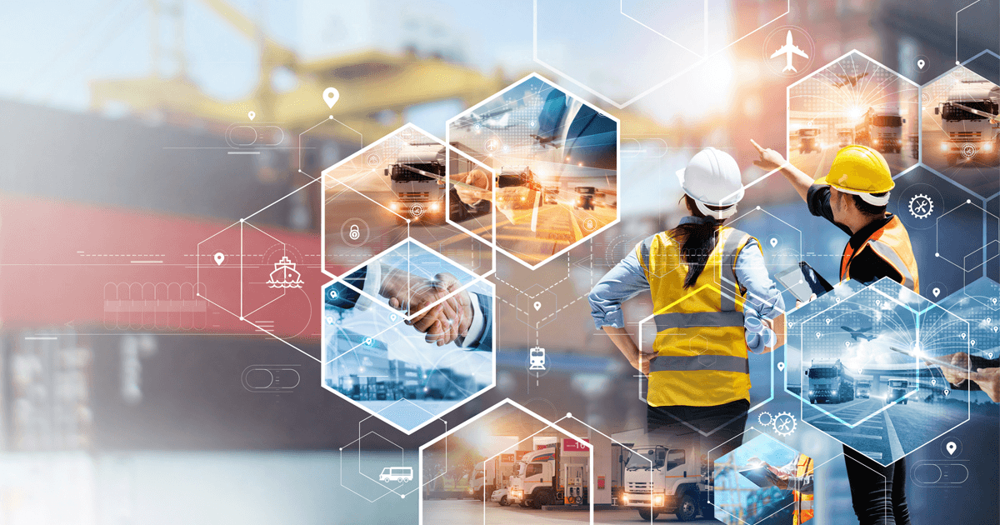

#  **About Dataset**

A DataSet of Supply Chains used by the company DataCo Global was used for the analysis. Dataset of Supply Chain , which allows the use of Machine Learning Algorithms and R Software. Areas of important registered activities : Provisioning , Production , Sales , Commercial Distribution.It also allows the correlation of Structured Data with Unstructured Data for knowledge generation.

Type Data : Structured Data : DataCoSupplyChainDataset.csv Unstructured Data : tokenized_access_logs.csv (Clickstream)

Types of Products : Clothing , Sports , and Electronic Supplies

Additionally it is attached in another file called DescriptionDataCoSupplyChain.csv, the description of each of the variables of the DataCoSupplyChainDatasetc.csv.c.csv.

# **Initial Exploration**

We'll begin by loading the necessary libraries and examining the structure of the dataset to identify important variables and check for missing values.

## **What we need to know:**

* Understand the overall structure of the data.
* Identify any missing values and address them.
* Explore basic statistical summaries of numeric and categorical variables.es.

In [1]:
# Install necessary packages if not already installed
install.packages(c("tidyverse", "skimr", "corrplot", "maps", "ggmap"))
install.packages("gridExtra")
install.packages("plotly")


# Load libraries
library(tidyverse)  # For data manipulation and visualization
library(skimr)      # For quick summary statistics
library(corrplot)   # For correlation matrix
library(scales)  # Load scales package for number formatting
library(plotly)


options(repr.plot.width = 16, repr.plot.height = 12)
options(warn=-1)

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
corrplot 0.95 loaded


Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor



Attaching package: ‘plotly’


The

In [2]:
FILL_COLOR <- "#1E3E62"

In [3]:
# List all files in the directory
list.files("/kaggle/input/dataco-smart-supply-chain-for-big-data-analysis")

[1] "DataCoSupplyChainDataset.csv"     "DescriptionDataCoSupplyChain.csv"
[3] "tokenized_access_logs.csv"

In [4]:
# Reading a CSV file from the directory
data <- read.csv("/kaggle/input/dataco-smart-supply-chain-for-big-data-analysis/DataCoSupplyChainDataset.csv")

# View the first few rows of the data
head(data)

,Type,Days.for.shipping..real.,Days.for.shipment..scheduled.,Benefit.per.order,Sales.per.customer,Delivery.Status,Late_delivery_risk,Category.Id,Category.Name,Customer.City,⋯,Order.Zipcode,Product.Card.Id,Product.Category.Id,Product.Description,Product.Image,Product.Name,Product.Price,Product.Status,shipping.date..DateOrders.,Shipping.Mode
,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>,⋯,<int>,<int>,<int>,<lgl>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
1,DEBIT,3,4,91.25,314.64,Advance shipping,0,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
2,TRANSFER,5,4,-249.09,311.36,Late delivery,1,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
3,CASH,4,4,-247.78,309.72,Shipping on time,0,73,Sporting Goods,San Jose,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
4,DEBIT,3,4,22.86,304.81,Advance shipping,0,73,Sporting Goods,Los Angeles,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
5,PAYMENT,2,4,134.21,298.25,Advance shipping,0,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class
6,TRANSFER,6,4,18.58,294.98,Shipping canceled,0,73,Sporting Goods,Tonawanda,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/19/2018 11:03,Standard Class


In [5]:
tail(data)

,Type,Days.for.shipping..real.,Days.for.shipment..scheduled.,Benefit.per.order,Sales.per.customer,Delivery.Status,Late_delivery_risk,Category.Id,Category.Name,Customer.City,⋯,Order.Zipcode,Product.Card.Id,Product.Category.Id,Product.Description,Product.Image,Product.Name,Product.Price,Product.Status,shipping.date..DateOrders.,Shipping.Mode
,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>,⋯,<int>,<int>,<int>,<lgl>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
180514,PAYMENT,3,4,119.99,299.99,Advance shipping,0,45,Fishing,Lancaster,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/19/2016 5:04,Standard Class
180515,CASH,4,4,40.00,399.98,Shipping on time,0,45,Fishing,Brooklyn,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/20/2016 3:40,Standard Class
180516,DEBIT,3,2,-613.77,395.98,Late delivery,1,45,Fishing,Bakersfield,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/19/2016 1:34,Second Class
180517,TRANSFER,5,4,141.11,391.98,Late delivery,1,45,Fishing,Bristol,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/20/2016 21:00,Standard Class
180518,PAYMENT,3,4,186.23,387.98,Advance shipping,0,45,Fishing,Caguas,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/18/2016 20:18,Standard Class
180519,PAYMENT,4,4,168.95,383.98,Shipping on time,0,45,Fishing,Caguas,⋯,NA,1004,45,NA,http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe,Field & Stream Sportsman 16 Gun Fire Safe,399.98,0,1/19/2016 18:54,Standard Class


In [6]:
glimpse(data)

Rows: 180,519
Columns: 53
$ Type                          <chr> "DEBIT", "TRANSFER", "CASH", "DEBIT", "P…
$ Days.for.shipping..real.      <int> 3, 5, 4, 3, 2, 6, 2, 2, 3, 2, 6, 5, 4, 2…
$ Days.for.shipment..scheduled. <int> 4, 4, 4, 4, 4, 4, 1, 1, 2, 1, 2, 2, 2, 1…
$ Benefit.per.order             <dbl> 91.25, -249.09, -247.78, 22.86, 134.21, …
$ Sales.per.customer            <dbl> 314.64, 311.36, 309.72, 304.81, 298.25, …
$ Delivery.Status               <chr> "Advance shipping", "Late delivery", "Sh…
$ Late_delivery_risk            <int> 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1…
$ Category.Id                   <int> 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, …
$ Category.Name                 <chr> "Sporting Goods", "Sporting Goods", "Spo…
$ Customer.City                 <chr> "Caguas", "Caguas", "San Jose", "Los Ang…
$ Customer.Country              <chr> "Puerto Rico", "Puerto Rico", "EE. UU.",…
$ Customer.Email                <chr> "XXXXXXXXX", "XXXXXXXXX", "XXXXXXXXX", "…
$ Customer.Fna

In [7]:
df = tibble(data)

In [8]:
head(df)

Type,Days.for.shipping..real.,Days.for.shipment..scheduled.,Benefit.per.order,Sales.per.customer,Delivery.Status,Late_delivery_risk,Category.Id,Category.Name,Customer.City,⋯,Order.Zipcode,Product.Card.Id,Product.Category.Id,Product.Description,Product.Image,Product.Name,Product.Price,Product.Status,shipping.date..DateOrders.,Shipping.Mode
<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>,⋯,<int>,<int>,<int>,<lgl>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>
DEBIT,3,4,91.25,314.64,Advance shipping,0,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
TRANSFER,5,4,-249.09,311.36,Late delivery,1,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
CASH,4,4,-247.78,309.72,Shipping on time,0,73,Sporting Goods,San Jose,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
DEBIT,3,4,22.86,304.81,Advance shipping,0,73,Sporting Goods,Los Angeles,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
PAYMENT,2,4,134.21,298.25,Advance shipping,0,73,Sporting Goods,Caguas,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class
TRANSFER,6,4,18.58,294.98,Shipping canceled,0,73,Sporting Goods,Tonawanda,⋯,NA,1360,73,NA,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/19/2018 11:03,Standard Class


In [9]:
summary(df)

     Type           Days.for.shipping..real. Days.for.shipment..scheduled.
 Length:180519      Min.   :0.000            Min.   :0.000                
 Class :character   1st Qu.:2.000            1st Qu.:2.000                
 Mode  :character   Median :3.000            Median :4.000                
                    Mean   :3.498            Mean   :2.932                
                    3rd Qu.:5.000            3rd Qu.:4.000                
                    Max.   :6.000            Max.   :4.000                
                                                                          
 Benefit.per.order  Sales.per.customer Delivery.Status    Late_delivery_risk
 Min.   :-4274.98   Min.   :   7.49    Length:180519      Min.   :0.0000    
 1st Qu.:    7.00   1st Qu.: 104.38    Class :character   1st Qu.:0.0000    
 Median :   31.52   Median : 163.99    Mode  :character   Median :1.0000    
 Mean   :   21.98   Mean   : 183.11                       Mean   :0.5483    
 3rd Qu.:   64.

In [10]:
# Total number of missing values in the dataset
sum(is.na(df))

[1] 336201

In [11]:
# Count missing values column-wise
colSums(is.na(df))

Type      Days.for.shipping..real. 
                            0                             0 
Days.for.shipment..scheduled.             Benefit.per.order 
                            0                             0 
           Sales.per.customer               Delivery.Status 
                            0                             0 
           Late_delivery_risk                   Category.Id 
                            0                             0 
                Category.Name                 Customer.City 
                            0                             0 
             Customer.Country                Customer.Email 
                            0                             0 
               Customer.Fname                   Customer.Id 
                            0                             0 
               Customer.Lname             Customer.Password 
                            0                             0 
             Customer.Segment                Customer.State 
                            0                             0 
              Customer.Street              Customer.Zipcode 
                            0                             3 
                Department.Id               Department.Name 
                            0                             0 
                     Latitude                     Longitude 
                            0                             0 
                       Market                    Order.City 
                            0                             0 
                Order.Country             Order.Customer.Id 
                            0                             0 
      order.date..DateOrders.                      Order.Id 
                            0                             0 
       Order.Item.Cardprod.Id           Order.Item.Discount 
                            0                             0 
     Order.Item.Discount.Rate                 Order.Item.Id 
                            0                             0 
     Order.Item.Product.Price       Order.Item.Profit.Ratio 
                            0                             0 
          Order.Item.Quantity                         Sales 
                            0                             0 
             Order.Item.Total        Order.Profit.Per.Order 
                            0                             0 
                 Order.Region                   Order.State 
                            0                             0 
                 Order.Status                 Order.Zipcode 
                            0                        155679 
              Product.Card.Id           Product.Category.Id 
                            0                             0 
          Product.Description                 Product.Image 
                       180519                             0 
                 Product.Name                 Product.Price 
                            0                             0 
               Product.Status    shipping.date..DateOrders. 
                            0                             0 
                Shipping.Mode 
                            0

In [12]:
print(sum(df$Order.Profit.Per.Order == df$Benefit.per.order))
print(sum(df$Sales == df$Product.Price))
print(sum(df$Order.Item.Product.Price == df$Product.Price))
print(sum(df$Sales.per.customer == df$Order.Item.Total))
print(sum(df$Sales.per.customer == df$Product.Price))

# we can also use cor()
cor(df$Order.Profit.Per.Order, df$Benefit.per.order)
cor(df$Sales, df$Product.Price)

[1] 180519
[1] 99134
[1] 180519
[1] 180519
[1] 5486


[1] 1

[1] 0.7899482

In [13]:
# Remove useless columns
df <- df |>
select(-Customer.Email,
       -Customer.Password,
       -Product.Image,
       -Category.Id,
       -Customer.Fname,
       -Customer.Lname,
       -Customer.Zipcode,
       -Department.Id,
       -Order.Customer.Id,
       -Customer.Id,
       -Order.Id,
       -Order.Item.Cardprod.Id,
       -Order.Item.Id,
       -Order.Zipcode,
       -Product.Card.Id,
       -Product.Category.Id,
       -Product.Description,
       -Order.Item.Product.Price,
       -Order.Item.Total,
       -Benefit.per.order)

In [14]:
glimpse(df)

Rows: 180,519
Columns: 33
$ Type                          <chr> "DEBIT", "TRANSFER", "CASH", "DEBIT", "P…
$ Days.for.shipping..real.      <int> 3, 5, 4, 3, 2, 6, 2, 2, 3, 2, 6, 5, 4, 2…
$ Days.for.shipment..scheduled. <int> 4, 4, 4, 4, 4, 4, 1, 1, 2, 1, 2, 2, 2, 1…
$ Sales.per.customer            <dbl> 314.64, 311.36, 309.72, 304.81, 298.25, …
$ Delivery.Status               <chr> "Advance shipping", "Late delivery", "Sh…
$ Late_delivery_risk            <int> 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1…
$ Category.Name                 <chr> "Sporting Goods", "Sporting Goods", "Spo…
$ Customer.City                 <chr> "Caguas", "Caguas", "San Jose", "Los Ang…
$ Customer.Country              <chr> "Puerto Rico", "Puerto Rico", "EE. UU.",…
$ Customer.Segment              <chr> "Consumer", "Consumer", "Consumer", "Hom…
$ Customer.State                <chr> "PR", "PR", "CA", "CA", "PR", "NY", "PR"…
$ Customer.Street               <chr> "5365 Noble Nectar Island", "2679 Rustic…
$ Department.N

In [15]:
sum(is.na(df))

[1] 0

In [16]:
# Count missing values column-wise
colSums(is.na(df))

Type      Days.for.shipping..real. 
                            0                             0 
Days.for.shipment..scheduled.            Sales.per.customer 
                            0                             0 
              Delivery.Status            Late_delivery_risk 
                            0                             0 
                Category.Name                 Customer.City 
                            0                             0 
             Customer.Country              Customer.Segment 
                            0                             0 
               Customer.State               Customer.Street 
                            0                             0 
              Department.Name                      Latitude 
                            0                             0 
                    Longitude                        Market 
                            0                             0 
                   Order.City                 Order.Country 
                            0                             0 
      order.date..DateOrders.           Order.Item.Discount 
                            0                             0 
     Order.Item.Discount.Rate       Order.Item.Profit.Ratio 
                            0                             0 
          Order.Item.Quantity                         Sales 
                            0                             0 
       Order.Profit.Per.Order                  Order.Region 
                            0                             0 
                  Order.State                  Order.Status 
                            0                             0 
                 Product.Name                 Product.Price 
                            0                             0 
               Product.Status    shipping.date..DateOrders. 
                            0                             0 
                Shipping.Mode 
                            0

In [17]:
# Identify duplicate
duplicates <- duplicated(df)

In [18]:
# View duplicate
df[duplicates, ]

Type,Days.for.shipping..real.,Days.for.shipment..scheduled.,Sales.per.customer,Delivery.Status,Late_delivery_risk,Category.Name,Customer.City,Customer.Country,Customer.Segment,⋯,Sales,Order.Profit.Per.Order,Order.Region,Order.State,Order.Status,Product.Name,Product.Price,Product.Status,shipping.date..DateOrders.,Shipping.Mode
<chr>,<int>,<int>,<dbl>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>


In [19]:
# Count the number of duplicate
sum(duplicates)

[1] 0

In [20]:
# Removing duplicates if any
df <- distinct(df)

# **Date transformation and calculate shipping duration**

We'll convert **order.date..DateOrders**. and **shipping.date..DateOrders**. into a proper Date format and calculate the shipping duration (in days). Finally, we'll analyze the shipping duration to understand delivery trends.

### **What we need to know:**
* How long does it take to ship an order?
* Explore any delay patterns in shipping compared to the scheduled time.

### **Summary:**

* Date columns have been converted for analysis.
* Shipping duration is now calculated for further exploration.tion.

In [21]:
# Convert date columns and calculate shipping duration
df$order_date <- mdy_hms(df$order.date..DateOrders.)
df$shipping_date <- mdy_hms(df$shipping.date..DateOrders.)

# Calculate shipping duration
df$shipping_duration <- as.numeric(difftime(df$shipping_date, df$order_date, units = "days"))

In [22]:
# Summary statistics of shipping duration
summary(df$shipping_duration)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-364.9667    2.0000    3.0000    0.4836    5.0000    7.0000 

In [23]:
# Find rows with negative or NA shipping durations
anomalies <- df %>% filter(is.na(shipping_duration) | shipping_duration < 0)
print(anomalies)

# A tibble: 1,490 × 36
   Type     Days.for.shipping..real. Days.for.shipment..sch…¹ Sales.per.customer
   <chr>                       <int>                    <int>              <dbl>
 1 PAYMENT                         5                        2                87 
 2 TRANSFER                        6                        4               200 
 3 DEBIT                           3                        4               123.
 4 DEBIT                           6                        4               197.
 5 PAYMENT                         5                        2               255.
 6 PAYMENT                         5                        2               192 
 7 TRANSFER                        5                        4               230.
 8 DEBIT                           5                        4               118.
 9 DEBIT                           5                        4               117.
10 DEBIT                           4                        4               113.
# ℹ 1

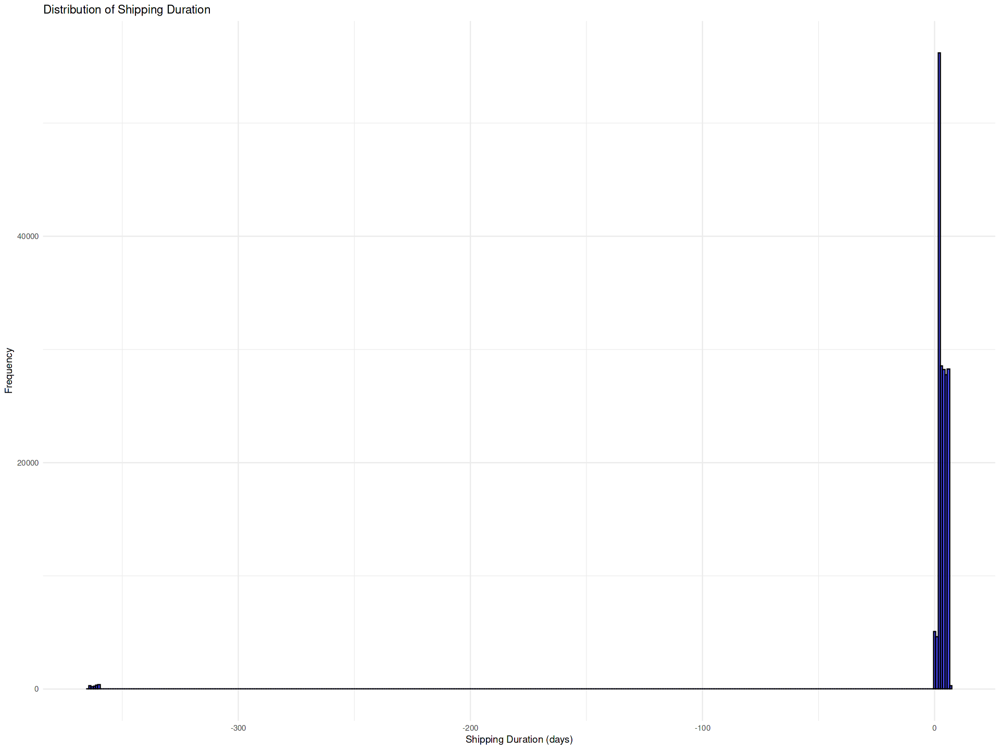

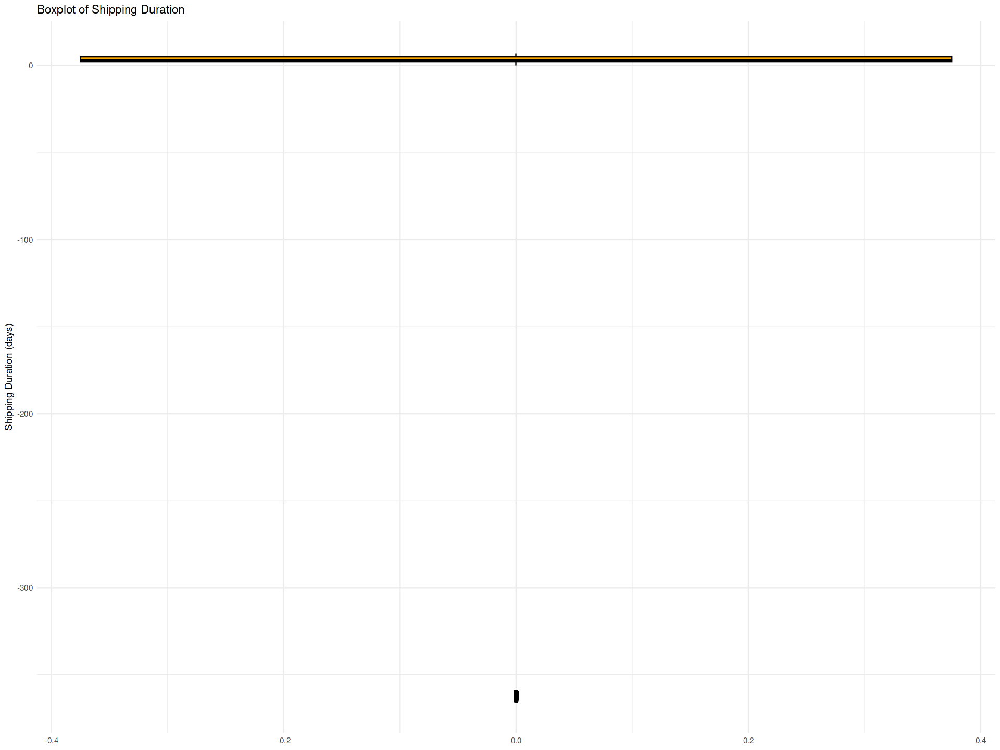

In [24]:
# Load ggplot2 for visualization
library(ggplot2)

# Histogram of shipping duration
ggplot(df, aes(x = shipping_duration)) +
  geom_histogram(binwidth = 1, fill = "blue", color = "black", alpha = 0.7) +
  labs(title = "Distribution of Shipping Duration", x = "Shipping Duration (days)", y = "Frequency") +
  theme_minimal()

# Boxplot of shipping duration
ggplot(df, aes(y = shipping_duration)) +
  geom_boxplot(fill = "orange", color = "black") +
  labs(title = "Boxplot of Shipping Duration", y = "Shipping Duration (days)") +
  theme_minimal()

# A tibble: 23 × 2
   Order.Region    avg_shipping_duration
   <chr>                           <dbl>
 1 Canada                          -3.92
 2 Caribbean                        3.53
 3 Central Africa                  -6.26
 4 Central America                  3.53
 5 Central Asia                    -3.86
 6 East Africa                     -4.78
 7 East of USA                      3.50
 8 Eastern Asia                    -6.12
 9 Eastern Europe                  -3.59
10 North Africa                    -5.24
# ℹ 13 more rows


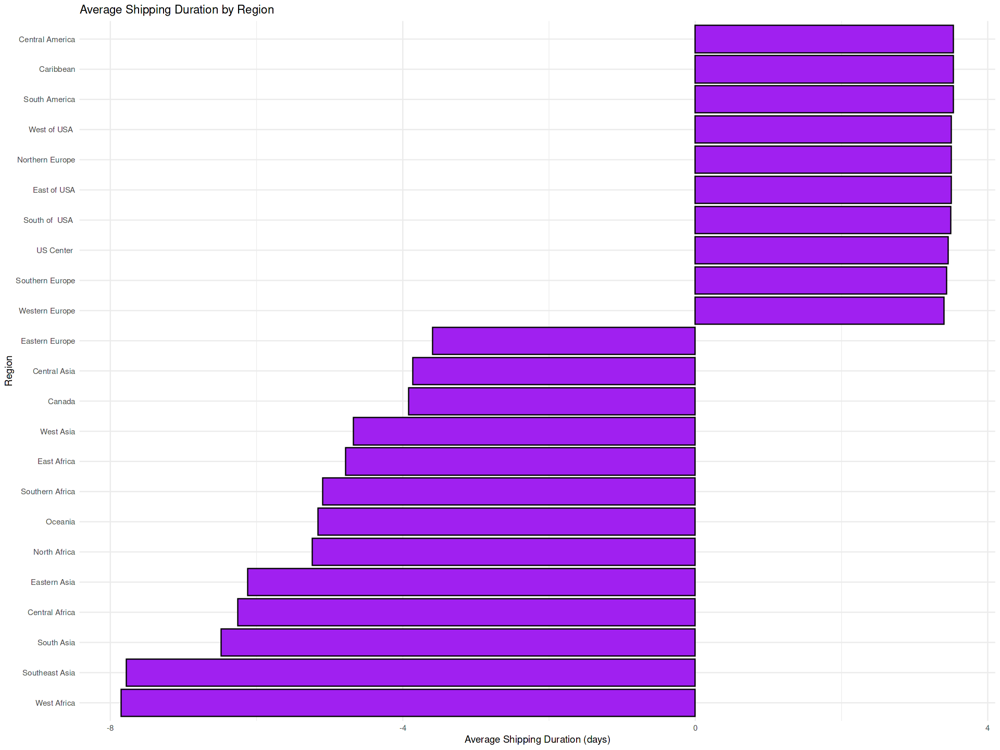

In [25]:
# Average shipping duration by region
region_shipping <- df %>%
  group_by(Order.Region) %>%
  summarise(avg_shipping_duration = mean(shipping_duration, na.rm = TRUE))

print(region_shipping)

# Plot average shipping duration by region
ggplot(region_shipping, aes(x = reorder(Order.Region, avg_shipping_duration), y = avg_shipping_duration)) +
  geom_bar(stat = "identity", fill = "purple", color = "black") +
  labs(title = "Average Shipping Duration by Region", x = "Region", y = "Average Shipping Duration (days)") +
  theme_minimal() +
  coord_flip()

In [26]:
# Convert Product.Status to a factor for better labeling in the plot
df$Product.Status <- factor(df$Product.Status, levels = c(0, 1), labels = c("Available", "Not Available"))

# **Explore Categorical Variables**

We will analyze the distribution of important categorical variables like **Type**, **Delivery.Status**, and **Shipping.Mode** to understand the nature of the transactions and deliveries.

### **What we need to know:**

* What types of transactions are most common?
* What are the most frequent delivery statuses and shipping modes?

### **Summary:**

* Most transactions are of type "DEBIT".
* Delivery status is mostly in "Late delivery."
* "Standard Class" is the most common shipping mode.

**Summarize and visualize the distribution of transaction types.**

# A tibble: 4 × 3
  Type     count percentage
  <chr>    <int>      <dbl>
1 CASH     19616       10.9
2 DEBIT    69295       38.4
3 PAYMENT  41725       23.1
4 TRANSFER 49883       27.6


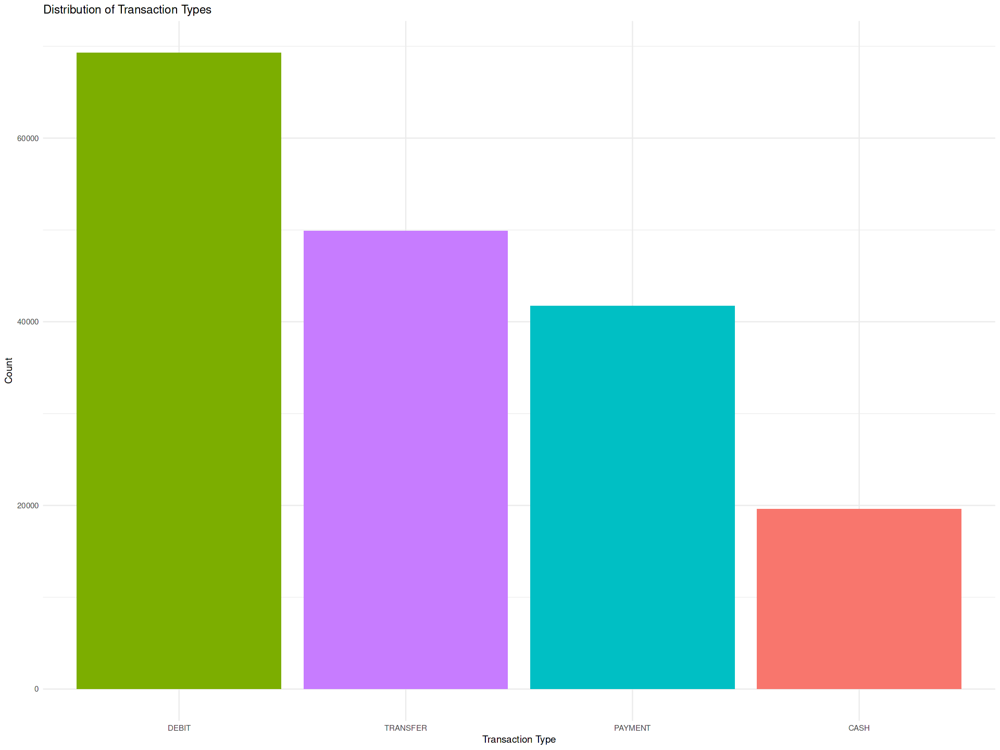

In [27]:
# Summary of transaction types
type_summary <- df %>%
  group_by(Type) %>%
  summarise(count = n()) %>%
  mutate(percentage = round((count / sum(count)) * 100, 2))

print(type_summary)

# Bar plot for transaction types
ggplot(type_summary, aes(x = reorder(Type, -count), y = count, fill = Type)) +
  geom_bar(stat = "identity", show.legend = FALSE) +
  labs(title = "Distribution of Transaction Types", x = "Transaction Type", y = "Count") +
  theme_minimal()

**Analyze the most frequent delivery statuses.**

# A tibble: 4 × 3
  Delivery.Status   count percentage
  <chr>             <int>      <dbl>
1 Advance shipping  41592       23.0
2 Late delivery     98977       54.8
3 Shipping canceled  7754        4.3
4 Shipping on time  32196       17.8


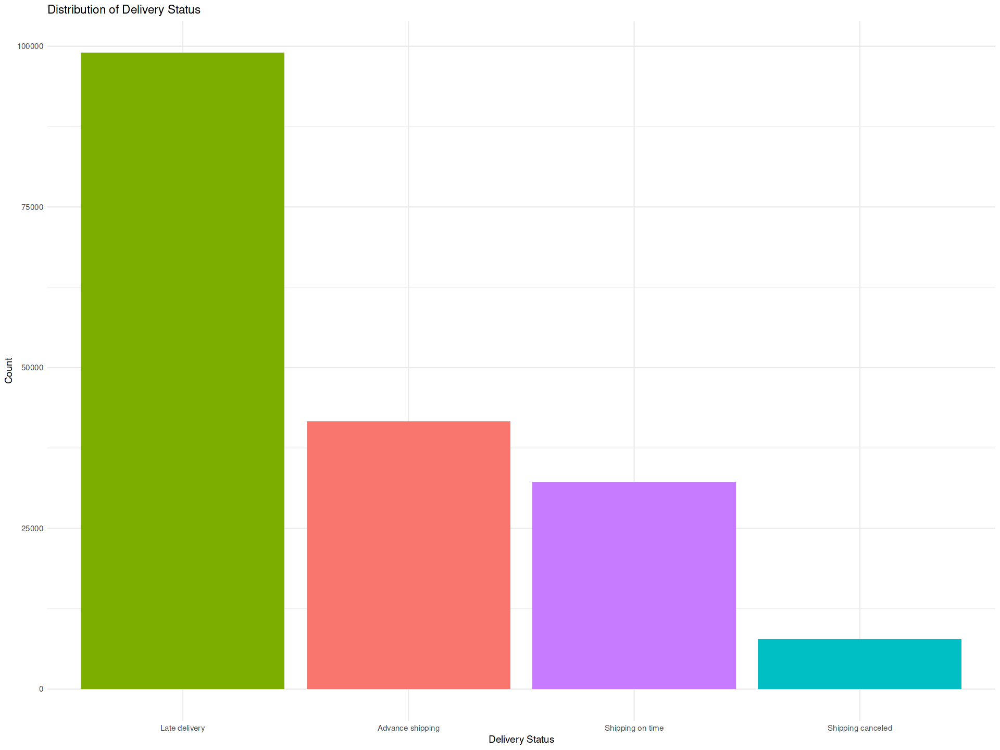

In [28]:
# Summary of delivery status
delivery_status_summary <- df %>%
  group_by(Delivery.Status) %>%
  summarise(count = n()) %>%
  mutate(percentage = round((count / sum(count)) * 100, 2))

print(delivery_status_summary)

# Bar plot for delivery status
ggplot(delivery_status_summary, aes(x = reorder(Delivery.Status, -count), y = count, fill = Delivery.Status)) +
  geom_bar(stat = "identity", show.legend = FALSE) +
  labs(title = "Distribution of Delivery Status", x = "Delivery Status", y = "Count") +
  theme_minimal()


**Understand the most frequent shipping modes.**

# A tibble: 4 × 3
  Shipping.Mode   count percentage
  <chr>           <int>      <dbl>
1 First Class     27814      15.4 
2 Same Day         9737       5.39
3 Second Class    35216      19.5 
4 Standard Class 107752      59.7 


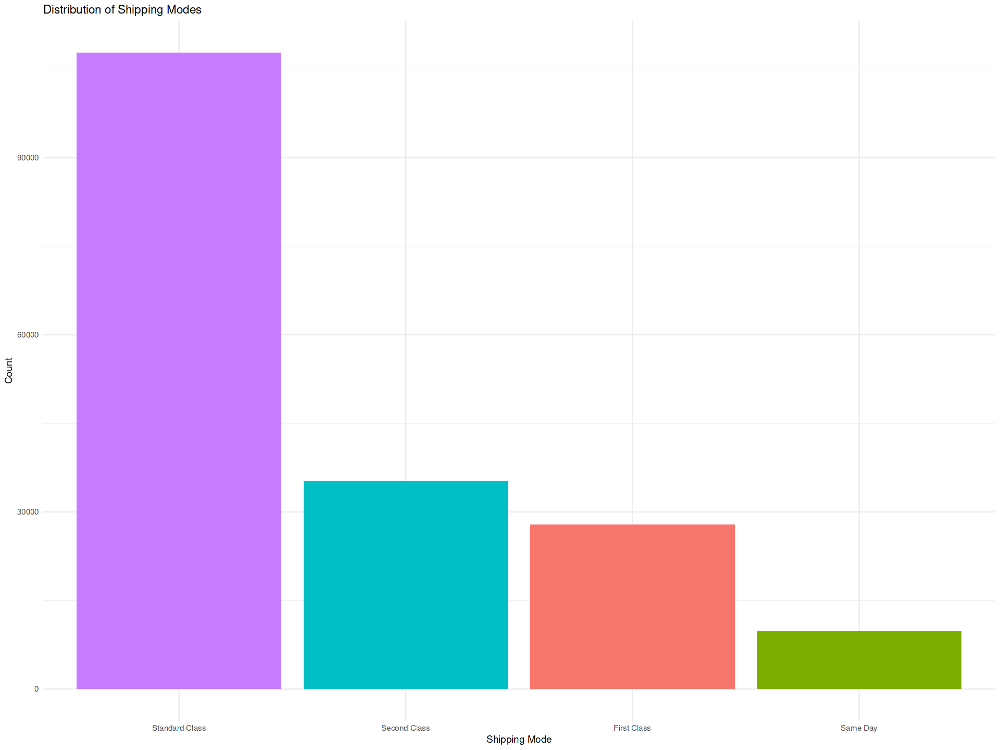

In [29]:
# Summary of shipping modes
shipping_mode_summary <- data %>%
  group_by(Shipping.Mode) %>%
  summarise(count = n()) %>%
  mutate(percentage = round((count / sum(count)) * 100, 2))

print(shipping_mode_summary)

# Bar plot for shipping modes
ggplot(shipping_mode_summary, aes(x = reorder(Shipping.Mode, -count), y = count, fill = Shipping.Mode)) +
  geom_bar(stat = "identity", show.legend = FALSE) +
  labs(title = "Distribution of Shipping Modes", x = "Shipping Mode", y = "Count") +
  theme_minimal()

# **Summary Statistics for Numeric Columns**
Next, we will generate summary statistics for numeric variables, such as Benefit.per.order,  Sales.per.customer, and Order.Item.Discount.

### **We need to know:**

* What are the ranges and typical values for these numeric variables?
* Are there any interesting patterns in the benefit per order and sales per costomer?

### **Summary:**

* Most benefits per order are positive, but there are outliers with negative benefits.
* Sales per customer vary widely, with some customers generating significantly higher sales.

In [30]:
# Summary statistics for numeric variables
df %>%
  select(Order.Profit.Per.Order, Sales.per.customer, Order.Item.Discount) %>%
  summary()

 Order.Profit.Per.Order Sales.per.customer Order.Item.Discount
 Min.   :-4274.98       Min.   :   7.49    Min.   :  0.00     
 1st Qu.:    7.00       1st Qu.: 104.38    1st Qu.:  5.40     
 Median :   31.52       Median : 163.99    Median : 14.00     
 Mean   :   21.98       Mean   : 183.11    Mean   : 20.66     
 3rd Qu.:   64.80       3rd Qu.: 247.40    3rd Qu.: 29.99     
 Max.   :  911.80       Max.   :1939.99    Max.   :500.00     


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




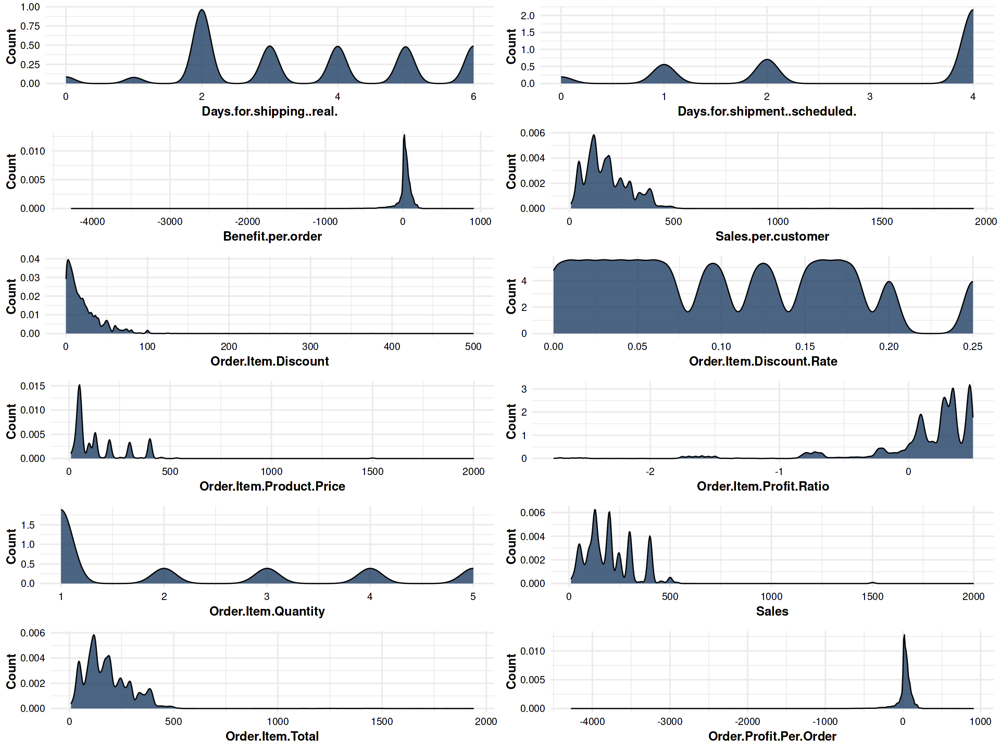

In [31]:
library(gridExtra)

# Selecting the numeric columns from the dataset
numeric_vars <- data %>% 
  select(Days.for.shipping..real., Days.for.shipment..scheduled., Benefit.per.order, 
         Sales.per.customer, Order.Item.Discount, Order.Item.Discount.Rate, 
         Order.Item.Product.Price, Order.Item.Profit.Ratio, Order.Item.Quantity, 
         Sales, Order.Item.Total, Order.Profit.Per.Order)

# Create a list to store histogram plots
hist_plots <- list()

# Loop through numeric variables and create histograms
for (var in colnames(numeric_vars)) {
  hist_plots[[var]] <- ggplot(data, aes_string(x = var)) +
    geom_density(fill = FILL_COLOR, alpha = 0.8) +
    labs(x = var,
         y = "Count") +
    theme_minimal(base_size = 14) +
    theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 16),
          axis.title.x = element_text(face = "bold"),
          axis.title.y = element_text(face = "bold"),
          axis.text = element_text(color = "black"))
}

# Arrange histograms side by side
grid.arrange(grobs = hist_plots, ncol = 2)  # Change ncol to adjust the number of columns

# **Exploring Correlations Between Numeric Variables**

We will explore the correlations between numeric variables to identify relationships. This will help understand how variables such as Benefit.per.order and Sales.per.customer are related.

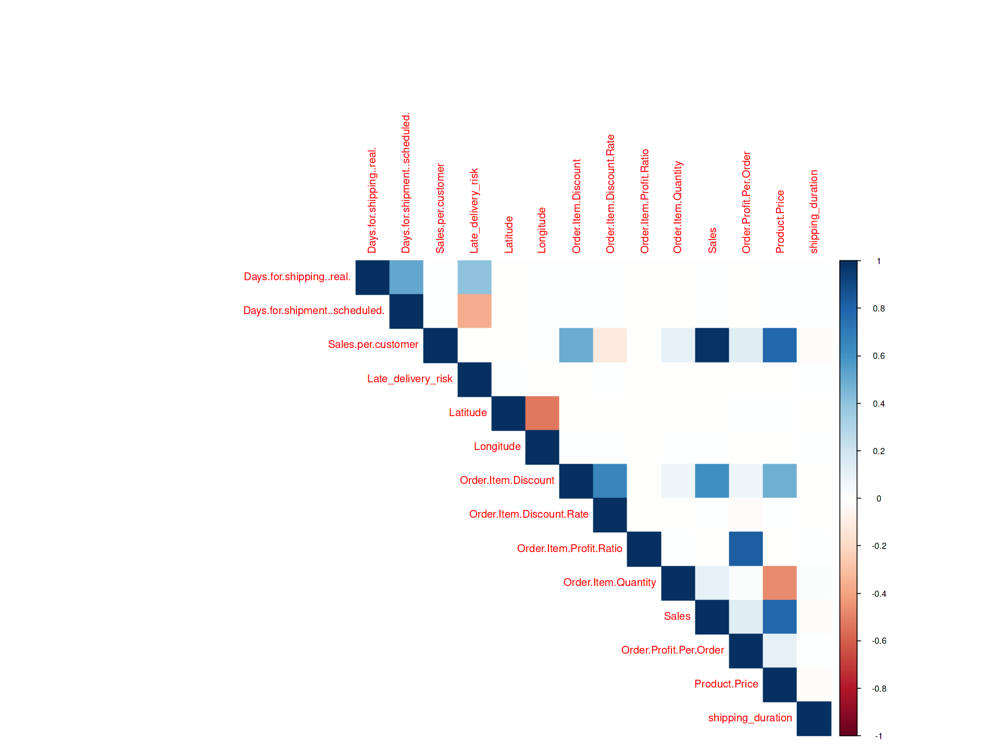

In [32]:
# Select numeric columns
numeric_cols <- df %>%
select_if(is.numeric)

# compute the correlation matrix
cor_matrix <- cor(numeric_cols, use="complete.obs")

# plot the correlation matrix
corrplot(cor_matrix,method ="color", type = "upper", t1.cex = 0.8) 

# **Lets Q/A some business questions**

1. **Which category has the most frequent late deliveries?**

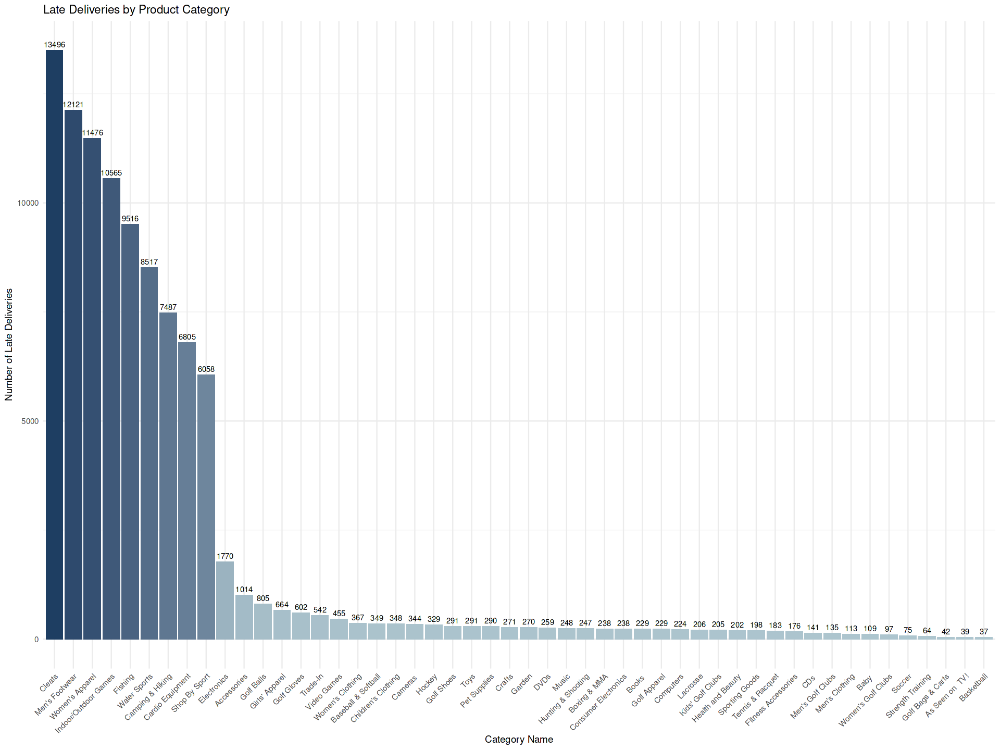

In [33]:
# Summarizing late deliveries by category
category_late_deliveries <- df %>%
  group_by(Category.Name) %>%
  summarise(late_count = sum(Late_delivery_risk == 1, na.rm = TRUE))

# Plotting the data with a heatmap effect
ggplot(category_late_deliveries, aes(x = reorder(Category.Name, -late_count), y = late_count, fill = late_count)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = late_count), vjust = -0.5, size = 3) +  # Adjust text size
  labs(title = "Late Deliveries by Product Category", 
       y = "Number of Late Deliveries", 
       x = "Category Name") +
  scale_fill_gradient(low = "#AEC6CF", high = "#1E3E62") +  # Heatmap effect with gradient
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +  # Rotate x-axis labels
  theme(legend.position = "none")

* Answer: **Cleats**, **Men's footwear**, **Women's Apparel** etc.. has the most frequent late deliveries.


2. **Which countries have the highest average sales per customer?**

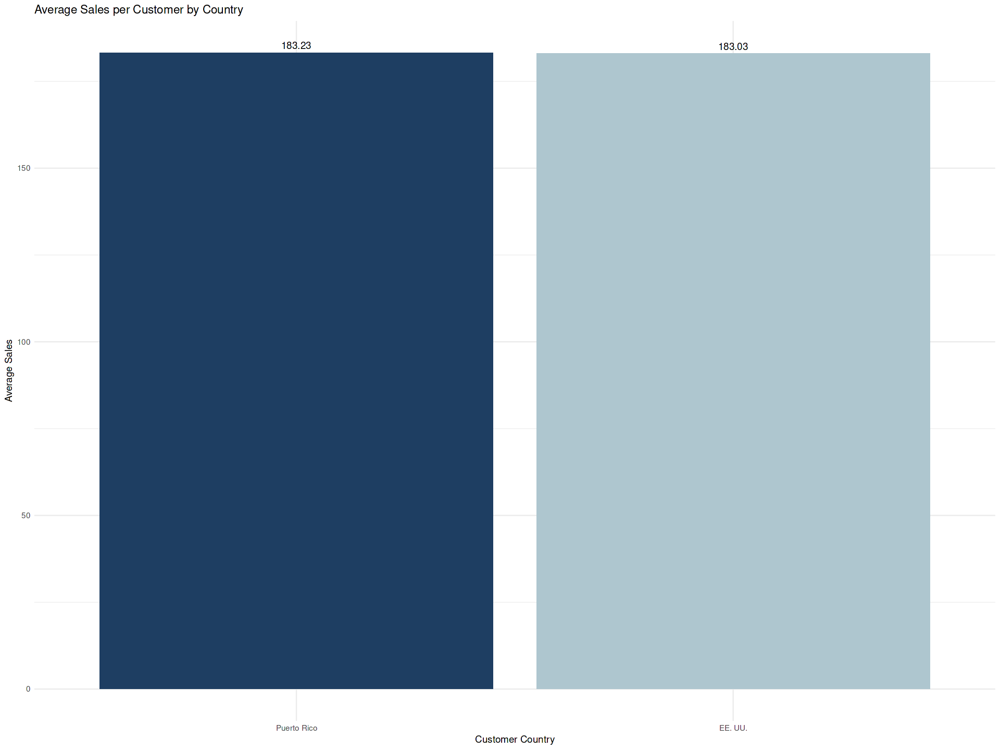

In [34]:
# Summarizing average sales by country
sales_by_country <- df %>%
  group_by(Customer.Country) %>%
  summarise(avg_sales = mean(Sales.per.customer, na.rm = TRUE))

# Plotting the data with a heatmap effect
ggplot(sales_by_country, aes(x = reorder(Customer.Country, -avg_sales), y = avg_sales, fill = avg_sales)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = round(avg_sales, 2)), vjust = -0.5) +
  labs(title = "Average Sales per Customer by Country", y = "Average Sales", x = "Customer Country") +
  scale_fill_gradient(low = "#AEC6CF", high = "#1E3E62") +  # Heatmap effect with gradient
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  theme_minimal() +
  theme(legend.position = "none")

* Answer: I think there is one country **EE. UU. EE UU** is the Spanish acronym for **Estados Unidos** or **United States** and **Puerto Rico** is a **Caribbean island** and unincorporated U.S. territory with a landscape of mountains,. Spanish often doubles the letters to indicate a plural acronym. And they almost equal.

# **Customer Analysis**

Customer analysis is a critical component in understanding business performance and making informed decisions. It involves examining customer behavior, segmentation, profitability, and preferences.

3. **Which customer segment contributes the most to profit?**

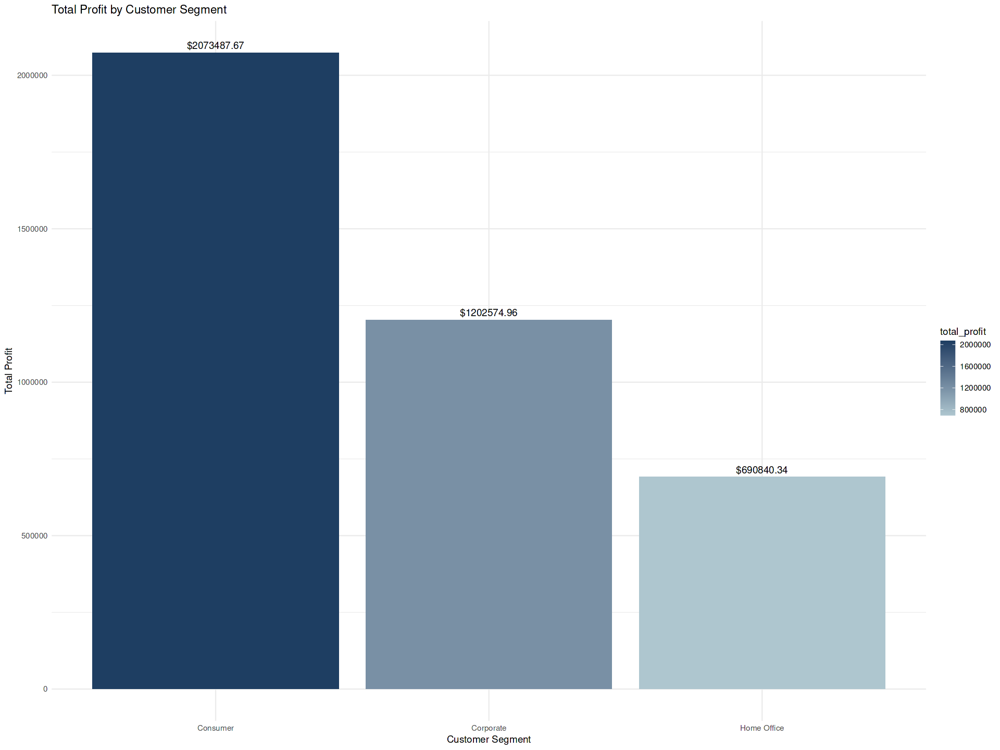

In [35]:
# Create the customer_profit dataframe
customer_profit <- df %>%
  group_by(Customer.Segment) %>%
  summarise(total_profit = sum(Order.Profit.Per.Order, na.rm = TRUE))

# Plot with a heatmap effect using a gradient
ggplot(customer_profit, aes(x = Customer.Segment, y = total_profit, fill = total_profit)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = paste("$", round(total_profit, 2), sep='')), vjust = -0.5) +
  labs(title = "Total Profit by Customer Segment", y = "Total Profit", x = "Customer Segment") +
  scale_fill_gradient(low = "#AEC6CF", high = "#1E3E62") +  # Heatmap effect with gradient
  theme_minimal()

* Answer: the most customer seg contributes to profit is **Consumer**.

4. **Average sales per customer in each segment?**

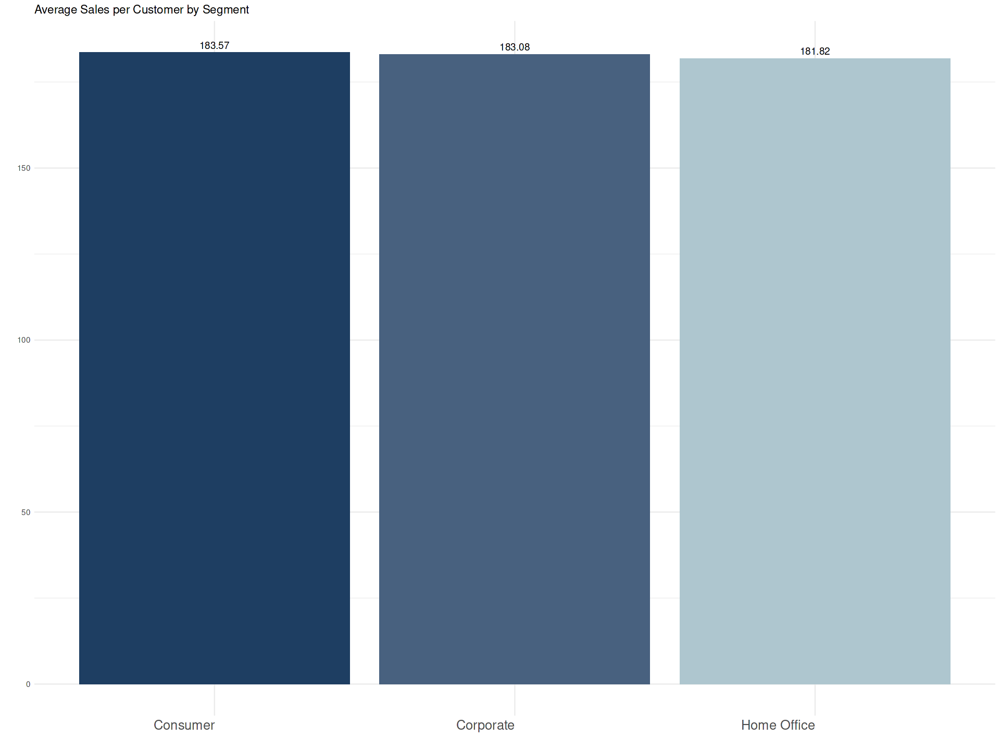

In [36]:
## Summarizing average sales by customer segment
segment_sales <- df %>%
  group_by(Customer.Segment) %>%
  summarise(avg_sales = mean(Sales.per.customer, na.rm = TRUE))

# Plotting the data with a heatmap effect
ggplot(segment_sales, aes(x = Customer.Segment, y = avg_sales, fill = avg_sales)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = round(avg_sales, 2)), vjust = -0.5) +
  labs(title = "Average Sales per Customer by Segment", y = "", x = "") +
  scale_fill_gradient(low = "#AEC6CF", high = "#1E3E62") +  # Heatmap effect with gradient
  theme_minimal() +
  theme(axis.text.x = element_text(hjust = 1, size = 15)) +
  theme(legend.position = "none")

## **Geographic Analysis of Customers**

 Customers' geographical distribution can be analyzed by their location attributes like **city**, **state**, or **country**.

5. **Which states have the highest sales per customer?**

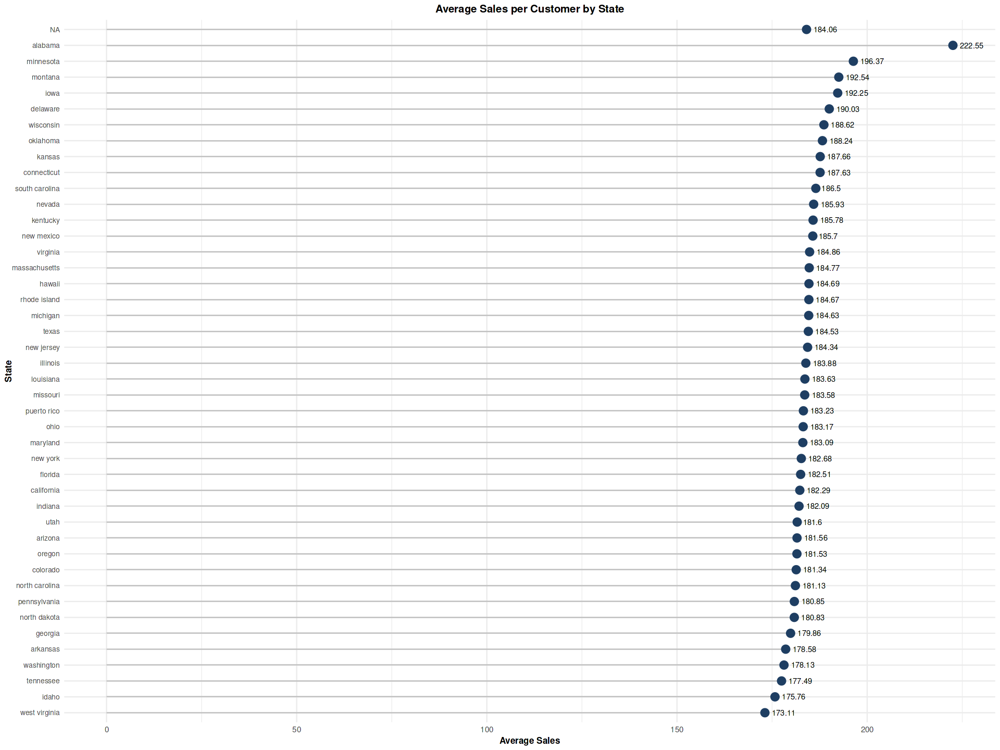

In [37]:
# Step 1: Create a conversion table for state abbreviations and full names
state_abbreviations <- data.frame(
  state = tolower(c(state.name, "puerto rico")),  # Add "Puerto Rico" to U.S. state names
  abb = c(state.abb, "PR")  # Add "PR" abbreviation for Puerto Rico
)

# Step 2: Summarizing average sales per customer by state
# Merge the conversion table with your data to get full state names
state_sales <- df %>%
  left_join(state_abbreviations, by = c("Customer.State" = "abb")) %>%  # Convert abbreviations to full names
  group_by(state) %>%  # Group by the full state name now
  summarise(avg_sales = mean(Sales.per.customer, na.rm = TRUE)) %>%
  arrange(desc(avg_sales))  # Order states by average sales

# Step 3: Create a lollipop chart
ggplot(state_sales, aes(x = reorder(state, avg_sales), y = avg_sales)) +
  geom_segment(aes(x = reorder(state, avg_sales), xend = reorder(state, avg_sales), 
                   y = 0, yend = avg_sales), color = "gray") +  # Lollipop stick
  geom_point(color = FILL_COLOR, size = 4) +  # Lollipop circle
  geom_text(aes(label = round(avg_sales, 2)), hjust = -0.3, size = 3) +  # Add text labels
  labs(title = "Average Sales per Customer by State", y = "Average Sales", x = "State") +
  coord_flip() +  # Flip the chart for better readability
  theme_minimal() +
  theme(
    axis.text.y = element_text(size = 8),  # Adjust y-axis text size for readability
    axis.title.x = element_text(size = 10, face = "bold"),  # Bold x-axis title
    axis.title.y = element_text(size = 10, face = "bold"),  # Bold y-axis title
    plot.title = element_text(size = 12, face = "bold", hjust = 0.5)  # Title centered and bold
  )

* Answer: **Alabama** state is the highest sales per customer.

## **Customer Retention and Delivery Performance**
Analyze how late delivery risk impacts customer segments or geographic areas. This is essential for improving service quality and customer satisfaction..

6. **Which customer segments have the highest late delivery risk?**

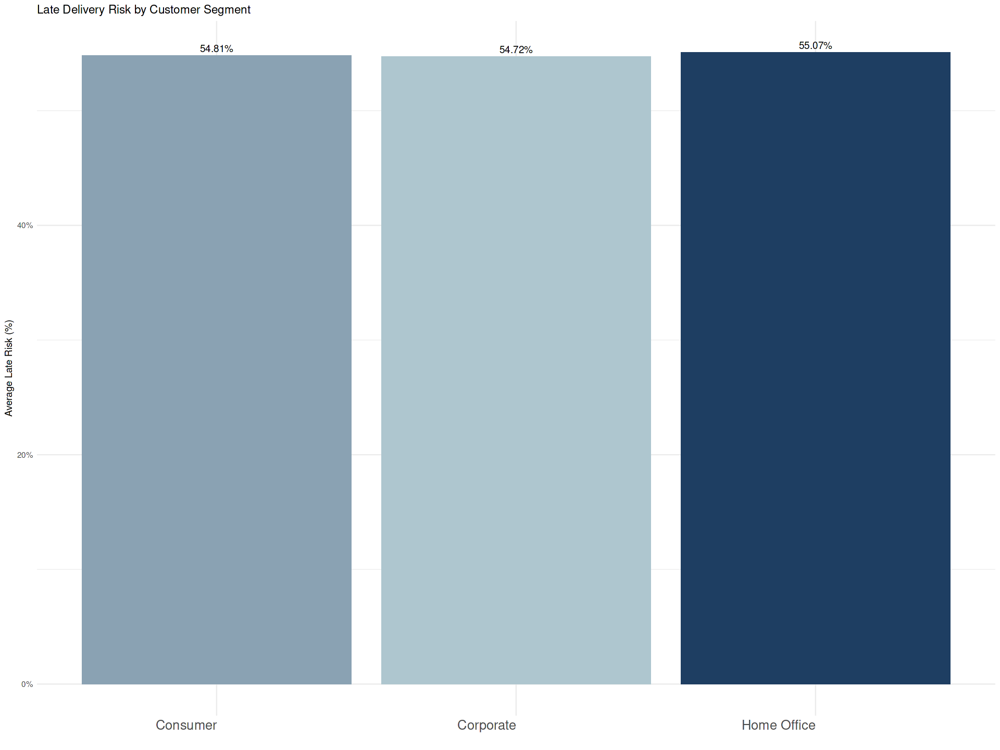

In [38]:
# Calculate average late delivery risk by customer segment
segment_late_risk <- df %>%
  group_by(Customer.Segment) %>%
  summarise(late_risk = mean(Late_delivery_risk, na.rm = TRUE)) %>%
  ungroup()

# Plotting the average late delivery risk with a heatmap effect
ggplot(segment_late_risk, aes(x = Customer.Segment, y = late_risk, fill = late_risk)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = scales::percent(late_risk, accuracy = 0.01)), vjust = -0.5) +  # Formatting the label as percentage
  labs(title = "Late Delivery Risk by Customer Segment", 
       y = "Average Late Risk (%)",  # Updated y-axis label
       x = "") +
  scale_y_continuous(labels = scales::percent) +  # Formatting y-axis as percentage
  scale_fill_gradient(low = "#AEC6CF", high = "#1E3E62") +  # Heatmap effect with gradient
  theme_minimal() +
  theme(axis.text.x = element_text(hjust = 1, size = 15)) +
  theme(
    legend.position = "none"
  )

* Answer: **home office** have the highest late delivery risk.

## **Customer Profitability**
Understanding how much profit each customer generates is essential to focus on high-value customers.

7. **Find Top 10 customer cities by total profit?**

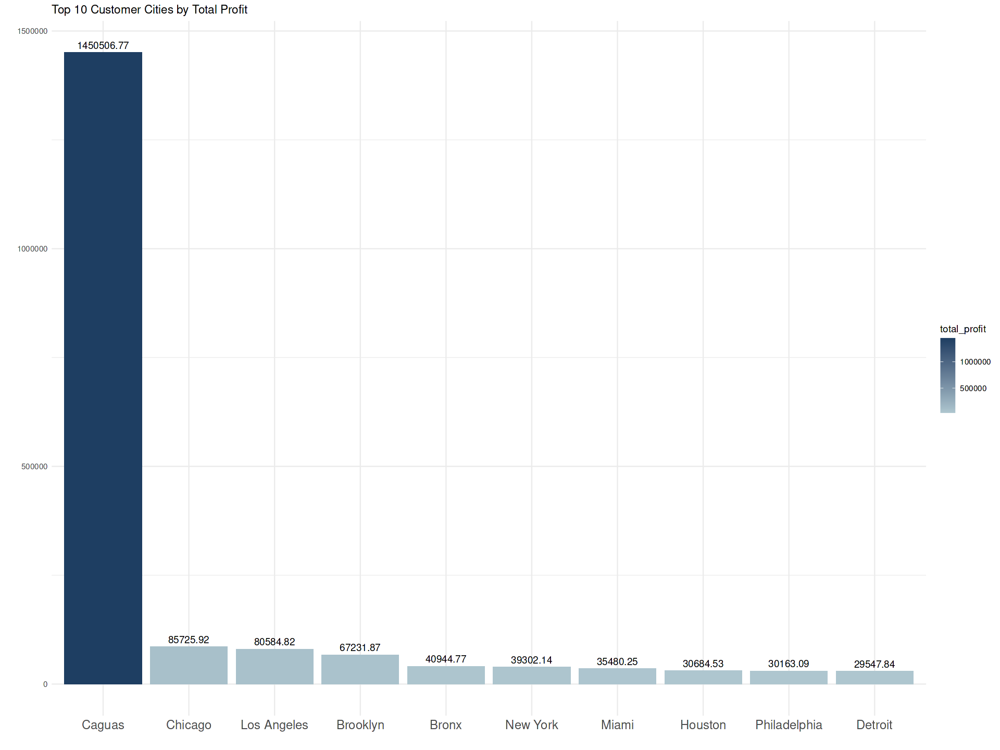

In [39]:
# Create a palette based on the base color #1E3E62
base_color <- "#1E3E62"
palette <- colorRampPalette(c(base_color, "#AEC6CF", "#D9EAD3", "#FFE599", "#B6D7A8"))(10)

# Create the top_customers dataframe
top_customers <- df %>%
  group_by(Customer.City) %>%
  summarise(total_profit = sum(Order.Profit.Per.Order, na.rm = TRUE)) %>%
  arrange(desc(total_profit)) %>%
  head(10)

# Plot with a heatmap effect using a gradient
ggplot(top_customers, aes(x = reorder(Customer.City, -total_profit), y = total_profit, fill = total_profit)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = round(total_profit, 2)), vjust = -0.5) +
  labs(title = "Top 10 Customer Cities by Total Profit", y = "", x = "") +
  scale_fill_gradient(low = "#AEC6CF", high = base_color) +  # Heatmap effect with gradient
  theme_minimal() +
  theme(axis.text.x = element_text(hjust = 0.5, size = 14))

# Product Analysis

Product analysis helps businesses understand the performance of their products and identify opportunities for improvement or expansion.

8. **Find Top 10 Categories by Profit.**

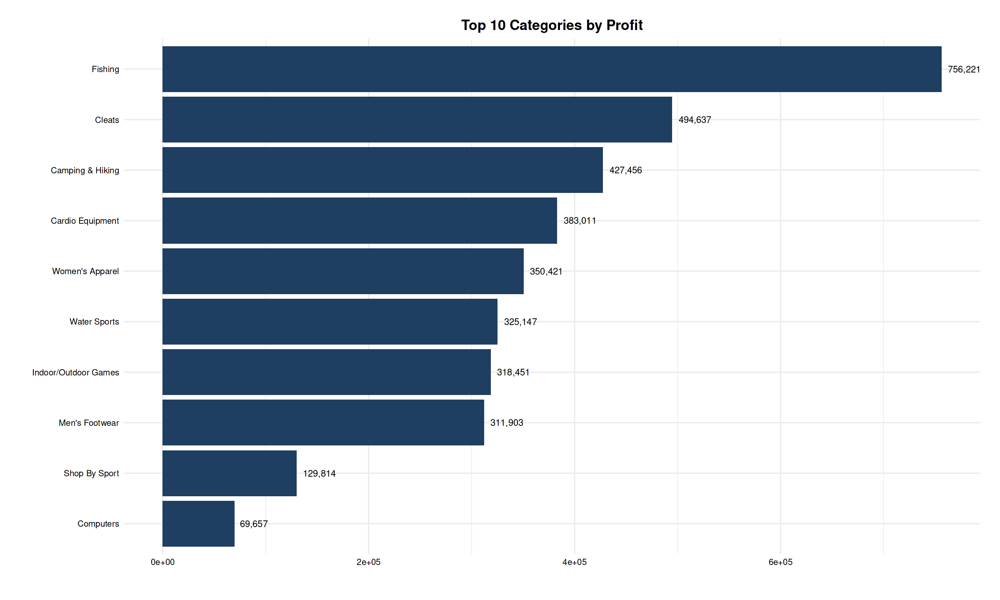

In [40]:
options(repr.plot.width = 20, repr.plot.height = 12)

# Summarize profit by category and limit to top 10
category_profit <- df %>%
  group_by(Category.Name) %>%
  summarize(Total_Profit = sum(Order.Profit.Per.Order, na.rm = TRUE)) %>%
  arrange(desc(Total_Profit)) %>%
  head(10)  # Limit to top 10

# Plot top 10 categories by profit with numbers formatted using scales
ggplot(category_profit, aes(x = reorder(Category.Name, Total_Profit), y = Total_Profit)) +
  geom_bar(stat = "identity", fill = FILL_COLOR) +  # Custom color
  geom_text(aes(label = scales::comma(Total_Profit)), hjust = -0.2, size = 4.5, color = "black") +  # Add numbers
  coord_flip() +
  theme_minimal(base_size = 15) +  # Modern theme with larger text
  labs(title = "Top 10 Categories by Profit",
       x = "", 
       y = "") +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 20),
        axis.title.x = element_text(face = "bold"),
        axis.title.y = element_text(face = "bold"),
        axis.text = element_text(color = "black"),
        plot.margin = unit(c(1, 1, 1, 1), "cm"))

9. **Find Top 10 Products by Sales.**

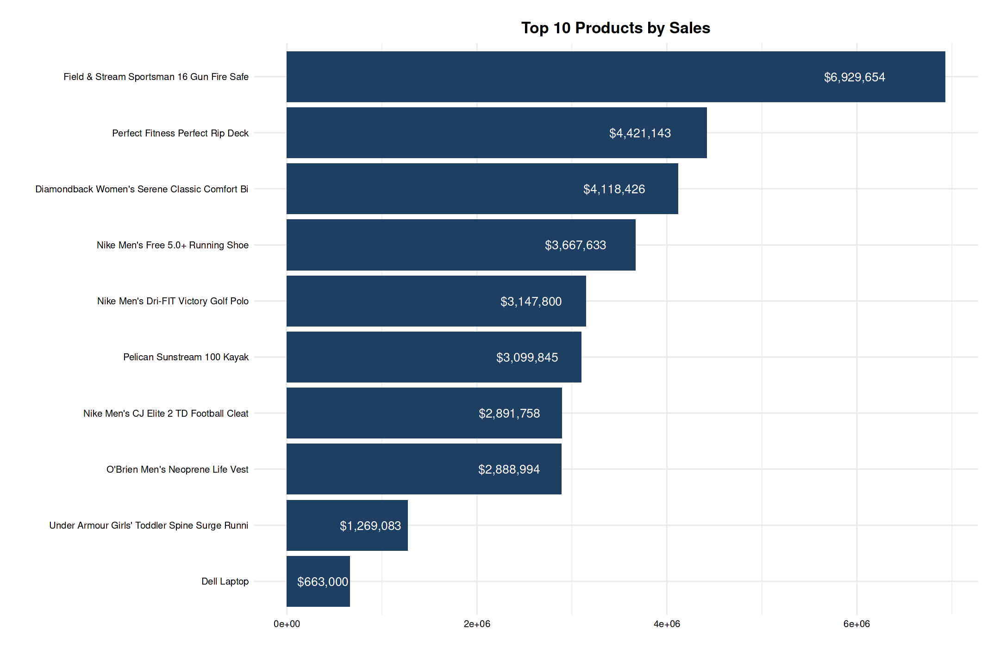

In [41]:
options(repr.plot.width = 18, repr.plot.height = 12)

# Summarize total sales by product and limit to top 10
product_sales <- df %>%
  group_by(Product.Name) %>%
  summarize(Total_Sales = sum(Sales, na.rm = TRUE)) %>%
  arrange(desc(Total_Sales)) %>%
  head(10)  # Limit to top 10

# Plot top 10 products by sales with numbers inside bars
ggplot(product_sales, aes(x = reorder(Product.Name, Total_Sales), y = Total_Sales)) +
  geom_bar(stat = "identity", fill = FILL_COLOR) +  # Custom color
  geom_text(aes(label = scales::dollar(Total_Sales, prefix = "$", accuracy = 1)), hjust = 0.9, size = 5.5, color = "white", position = position_stack(vjust = 0.9)) +  # Labels inside bars
  coord_flip() +
  theme_minimal(base_size = 15) +  # Modern theme
  labs(title = "Top 10 Products by Sales",
       x = "", 
       y = "") +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 20),
        axis.title.x = element_text(face = "bold"),
        axis.title.y = element_text(face = "bold"),
        axis.text = element_text(color = "black"),
        plot.margin = unit(c(1, 1, 1, 1), "cm"))

10. **Find Total Profit by Customer City.**

In [42]:
library(leaflet)
library(htmltools)

# Step 1: Prepare the customer location data
location_data <- df %>%
  select(Customer.City, Customer.Country, Latitude, Longitude, Order.Profit.Per.Order) %>%
  group_by(Customer.City, Customer.Country, Latitude, Longitude) %>%
  summarize(Total_Profit = sum(Order.Profit.Per.Order, na.rm = TRUE)) %>%
  ungroup()

# Step 2: Create a color palette based on profit bins
mybins <- quantile(location_data$Total_Profit, probs = seq(0, 1, by = 0.2), na.rm = TRUE)
mypalette <- colorBin(palette = "YlOrBr", domain = location_data$Total_Profit, na.color = "transparent", bins = mybins)

# Step 3: Prepare the text for tooltips
mytext <- paste0(
  "<strong>City: </strong>", location_data$Customer.City, "<br/>",
  "<strong>Country: </strong>", location_data$Customer.Country, "<br/>",
  "<strong>Total Profit: </strong>$", round(location_data$Total_Profit, 2)
) %>% lapply(htmltools::HTML)

# Step 4: Create the leaflet map
interactive_map <- leaflet(location_data) %>%
  addTiles() %>%
  setView(lat = mean(location_data$Latitude, na.rm = TRUE), 
          lng = mean(location_data$Longitude, na.rm = TRUE), 
          zoom = 2) %>%
  addProviderTiles("Esri.WorldImagery") %>%
  addCircleMarkers(~Longitude, ~Latitude,
    fillColor = ~mypalette(Total_Profit), fillOpacity = 0.7, color = "white", radius = 8, stroke = FALSE,
    label = mytext,
    labelOptions = labelOptions(
      style = list("font-weight" = "normal", padding = "3px 8px"),
      textsize = "13px", direction = "auto"
    )
  ) %>%
  addLegend(
    pal = mypalette, values = ~Total_Profit,
    opacity = 0.9, title = "Total Profit",
    position = "bottomright"
  )

# Step 5: Display the interactive map
interactive_map

`summarise()` has grouped output by 'Customer.City', 'Customer.Country',
'Latitude'. You can override using the `.groups` argument.


HTML widgets cannot be represented in plain text (need html)

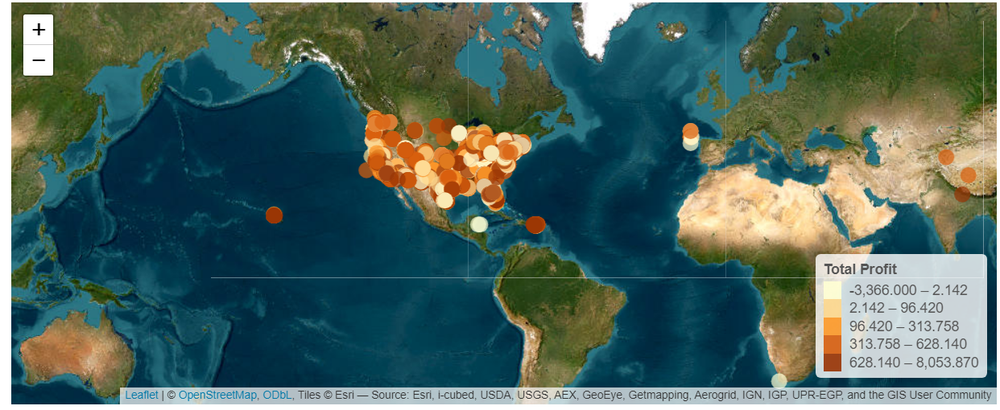

11. **Find Top 10 Products by Quantity Ordered.**

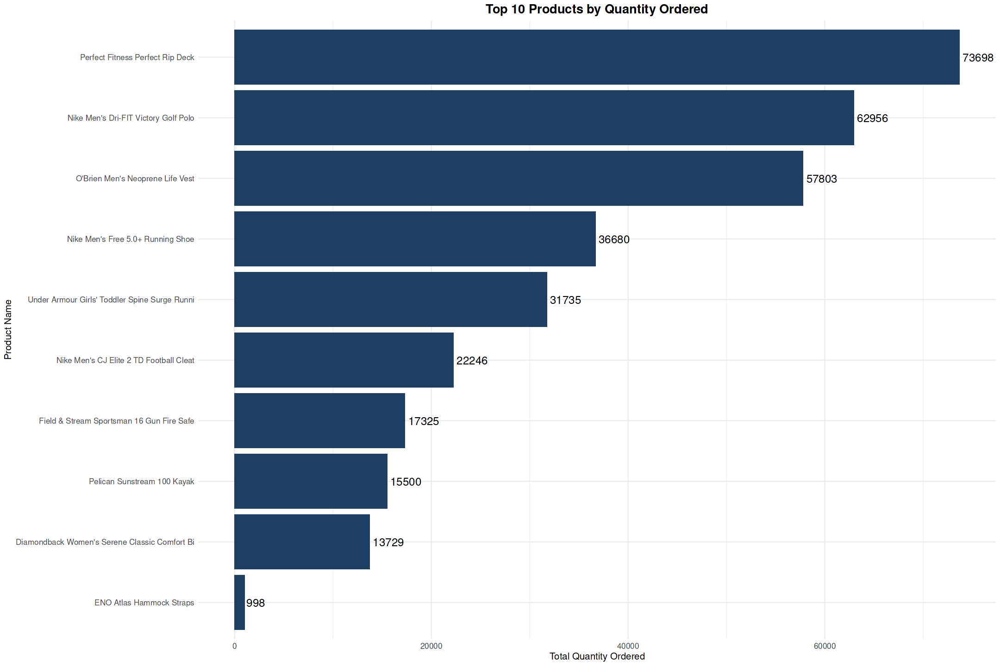

In [43]:
# Group by Product Name and calculate total quantity
top_products <- df %>%
  group_by(Product.Name) %>%
  summarise(Total.Quantity = sum(Order.Item.Quantity, na.rm = TRUE)) %>%  # Handle NA values in Quantity
  arrange(desc(Total.Quantity)) %>%
  slice_head(n = 10)  # Use slice_head() instead of head() for consistency with dplyr syntax

# Create a bar plot using ggplot2
ggplot(top_products, aes(x = reorder(Product.Name, Total.Quantity), y = Total.Quantity)) +
  geom_bar(stat = "identity", fill = FILL_COLOR) +  # Bar color
  geom_text(aes(label = Total.Quantity), hjust = -0.1, size = 5, color = "black") +  # Add labels outside bars
  coord_flip() +  # Flip coordinates for better readability
  labs(
    title = "Top 10 Products by Quantity Ordered",
    x = "Product Name",
    y = "Total Quantity Ordered"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold"),  # Center-align title
    axis.text.y = element_text(size = 10),  # Adjust y-axis text size
    axis.text.x = element_text(size = 10),  # Adjust x-axis text size
    axis.title = element_text(size = 12)   # Adjust axis title size
  )

12. **Find Top 10 Products with Highest Late Delivery Risk.**

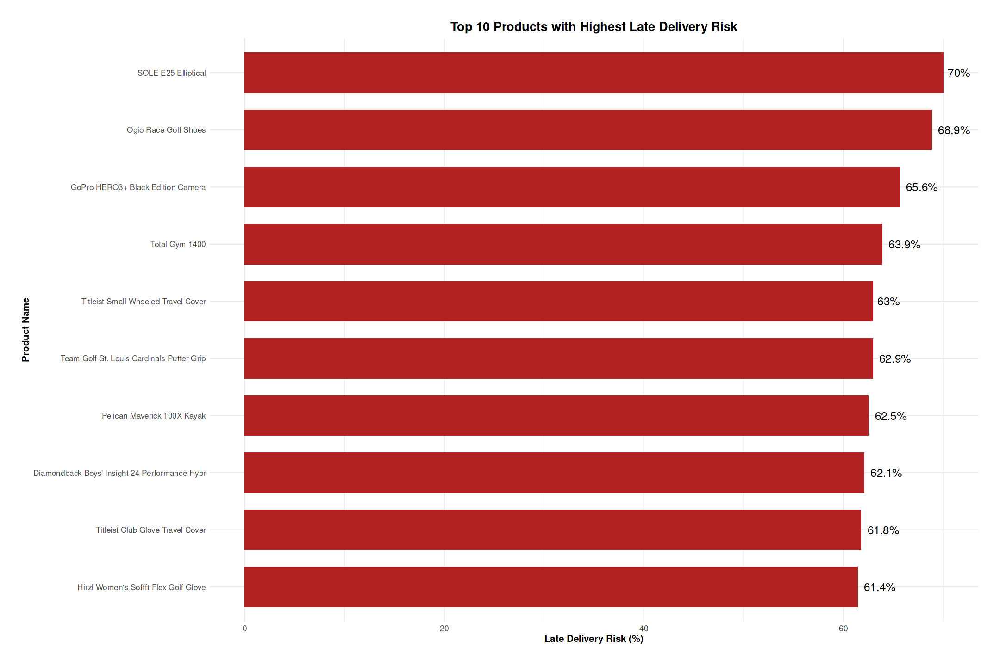

In [44]:
# Define fill color for the bar plot
FILL_COLOR <- "firebrick"

# Group by Product Name and calculate late delivery statistics
top_risk_products <- df %>%
  group_by(Product.Name) %>%
  summarise(
    Total.Orders = n(),
    Late.Orders = sum(Late_delivery_risk, na.rm = TRUE)  # Handle potential NA values in Late_delivery_risk
  ) %>%
  mutate(Percent.Late.Risk = (Late.Orders / Total.Orders) * 100) %>%
  arrange(desc(Percent.Late.Risk)) %>%
  slice_head(n = 10)  # Select top 10 products

# Visualize the top products with late delivery risk percentages
ggplot(top_risk_products, aes(x = reorder(Product.Name, Percent.Late.Risk), y = Percent.Late.Risk)) +
  geom_bar(stat = "identity", fill = FILL_COLOR, width = 0.7) +  # Add width for better bar spacing
  geom_text(
    aes(label = paste0(round(Percent.Late.Risk, 1), "%")),
    hjust = -0.2, size = 5, color = "black"
  ) +  # Show percentage labels outside the bars
  coord_flip() +  # Flip coordinates for better readability
  labs(
    title = "Top 10 Products with Highest Late Delivery Risk",
    x = "Product Name",
    y = "Late Delivery Risk (%)"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 16),
    axis.title.x = element_text(size = 12, face = "bold"),
    axis.title.y = element_text(size = 12, face = "bold"),
    axis.text = element_text(size = 10),
    plot.margin = unit(c(1, 1, 1, 1), "cm")  # Ensure enough margin for labels
  )

13. **Find the most shipping duration of products.**

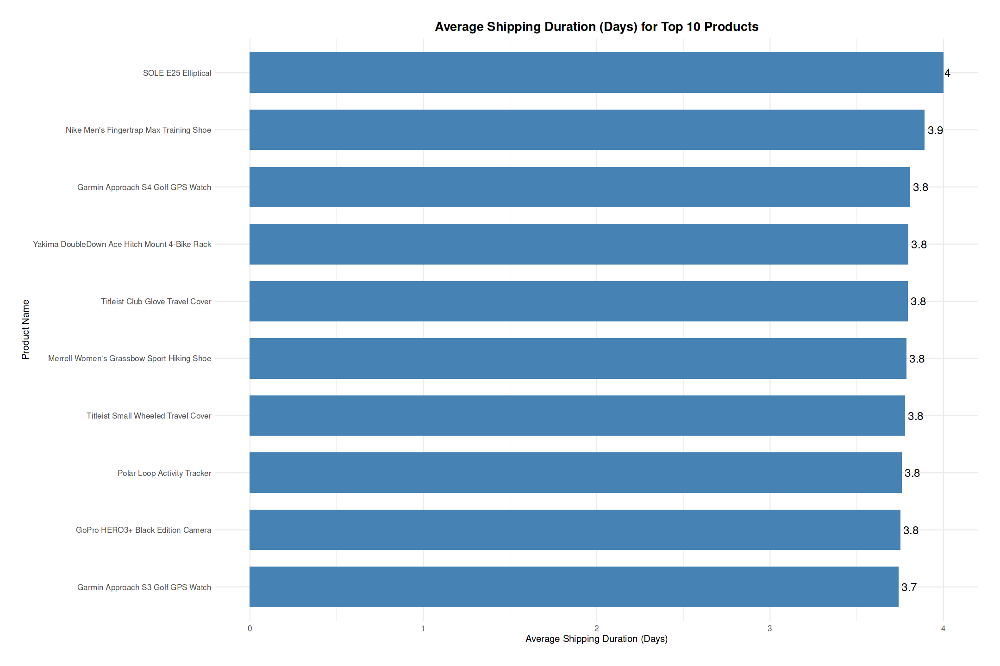

In [45]:
# Define the color for the bars
FILL_COLOR <- "steelblue"

# Filter data for valid shipping durations
filtered_df <- df %>% 
  filter(shipping_duration >= 0)  # Exclude negative durations, if any

# Calculate the average shipping duration by product
top_shipping_duration <- filtered_df %>%
  group_by(Product.Name) %>%
  summarise(Avg.Shipping.Duration = mean(shipping_duration, na.rm = TRUE)) %>%  # Handle NA values
  arrange(desc(Avg.Shipping.Duration)) %>%  # Sort by highest average shipping duration
  slice_head(n = 10)  # Select the top 10 products

# Visualize the average shipping duration for the top products
ggplot(top_shipping_duration, aes(x = reorder(Product.Name, Avg.Shipping.Duration), y = Avg.Shipping.Duration)) +
  geom_bar(stat = "identity", fill = FILL_COLOR, width = 0.7) +  # Adjust bar width
  geom_text(
    aes(label = round(Avg.Shipping.Duration, 1)), 
    hjust = -0.2, size = 5, color = "black"
  ) +  # Add average shipping duration as labels
  coord_flip() +  # Flip coordinates for better readability
  labs(
    title = "Average Shipping Duration (Days) for Top 10 Products",
    x = "Product Name",
    y = "Average Shipping Duration (Days)"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold"),
    axis.title.x = element_text(size = 12),
    axis.title.y = element_text(size = 12),
    axis.text.y = element_text(size = 10),
    axis.text.x = element_text(size = 10),
    plot.margin = unit(c(1, 1, 1, 1), "cm")  # Ensure proper margins
  )

14. **Find the Distribution of Sales by Product Status.**

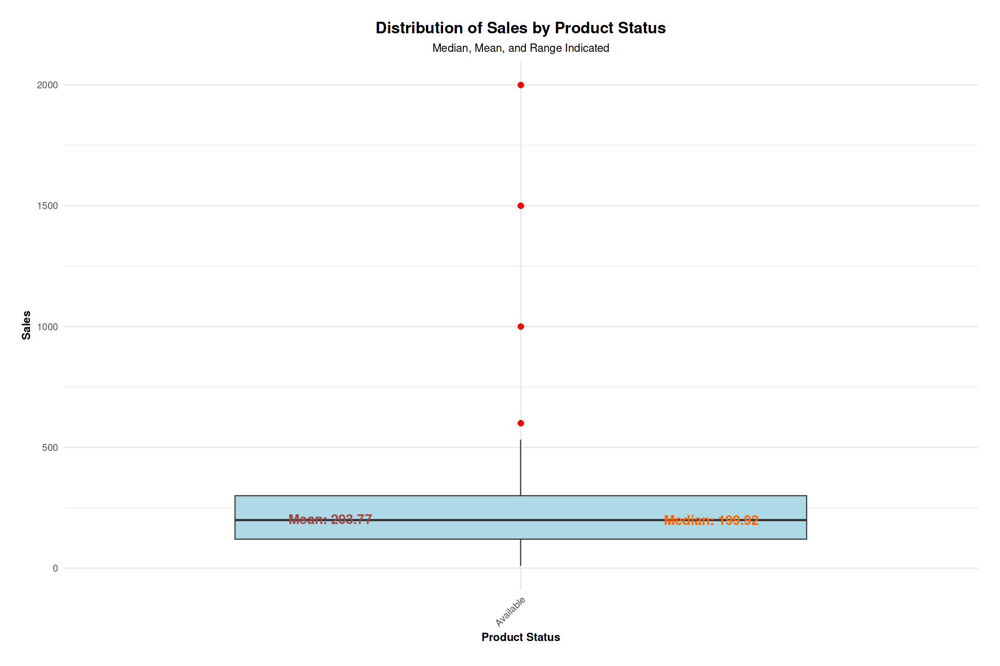

In [46]:
# Boxplot of Sales by Product Status
ggplot(df, aes(x = Product.Status, y = Sales)) +
  geom_boxplot(fill = "lightblue", outlier.color = "red", outlier.shape = 16, outlier.size = 3) +
  
  # Add median labels with improved alignment
  stat_summary(
    fun = median, 
    geom = "text", 
    aes(label = paste("Median:", round(..y.., 2))),
    position = position_nudge(x = 0.25), 
    size = 6, 
    color = "#FF6600", 
    fontface = "bold"
  ) +
  
  # Add mean labels for each box
  stat_summary(
    fun = mean, 
    geom = "text", 
    aes(label = paste("Mean:", round(..y.., 2))),
    position = position_nudge(x = -0.25), 
    size = 6, 
    color = "#A04747", 
    fontface = "bold"
  ) +
  
  # Add whisker labels (min and max values)
  stat_summary(
    fun.min = min, 
    fun.max = max, 
    geom = "text",
    aes(label = round(..y.., 2)),
    position = position_nudge(x = 0.35), 
    size = 5, 
    color = "blue", 
    fontface = "italic"
  ) +
  
  # Titles and labels
  labs(
    title = "Distribution of Sales by Product Status",
    subtitle = "Median, Mean, and Range Indicated",
    x = "Product Status",
    y = "Sales"
  ) +
  
  # Enhanced theme for better visualization
  theme_minimal(base_size = 16) +
  theme(
    plot.title = element_text(face = "bold", size = 20, hjust = 0.5),
    plot.subtitle = element_text(size = 14, hjust = 0.5),
    axis.title.x = element_text(face = "bold", size = 14),
    axis.title.y = element_text(face = "bold", size = 14),
    axis.text.x = element_text(size = 12, angle = 45, hjust = 1),
    axis.text.y = element_text(size = 12),
    plot.margin = unit(c(1, 1, 1, 1), "cm")
  )

# Order Regions Analysis

we can explore various questions related to order regions (**Order.Region**), **profit**, **sales**, and **delivery risk**.

15. **Find Sales and Profit by Region.**

In [47]:
region_summary <- df %>%
  group_by(Order.Region) %>%
  summarise(
    Total_Sales = sum(Sales, na.rm = TRUE),
    Avg_Profit_Per_Order = mean(Order.Profit.Per.Order, na.rm = TRUE),
    Total_Late_Delivery_Risk = sum(Late_delivery_risk, na.rm = TRUE)
  )

# View the summary table
region_summary

Order.Region,Total_Sales,Avg_Profit_Per_Order,Total_Late_Delivery_Risk
<chr>,<dbl>,<dbl>,<int>
Canada,186861.0,24.92253,468
Caribbean,1651019.3,20.65709,4415
Central Africa,327263.0,19.94470,972
Central America,5665712.1,21.74735,15518
Central Asia,109839.9,23.59002,306
East Africa,376234.9,23.30871,1036
East of USA,1371112.0,22.59773,3849
Eastern Asia,1486401.3,20.24286,3955
Eastern Europe,774266.6,20.33598,2182


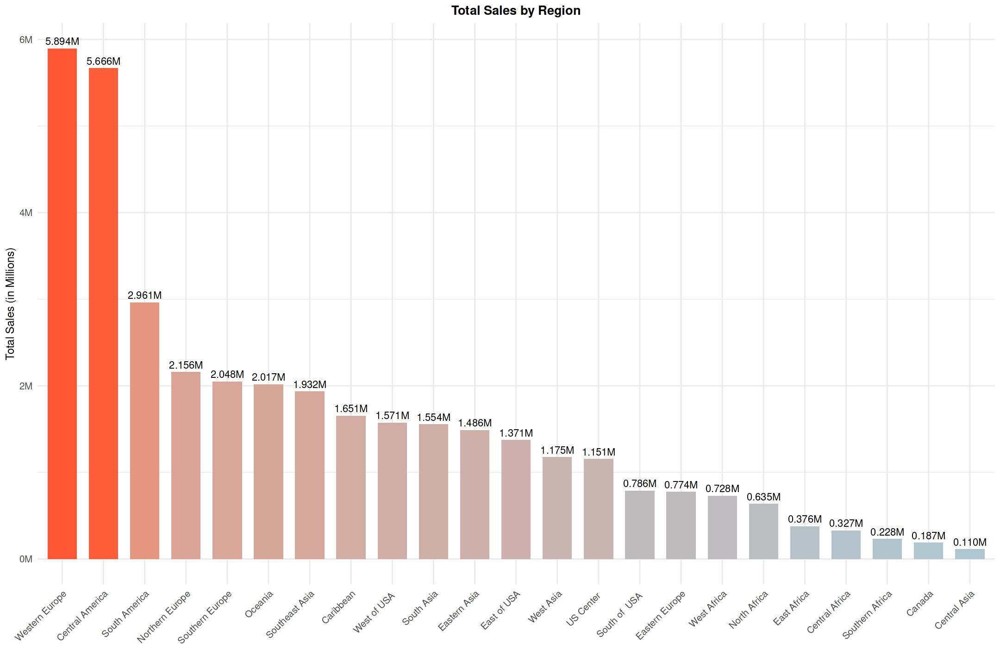

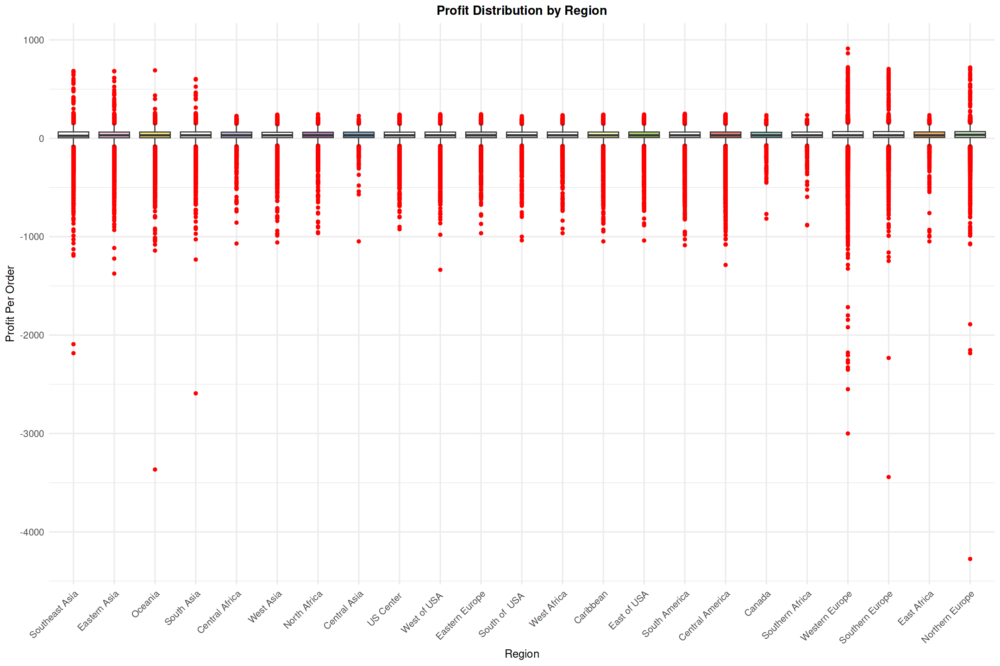

In [48]:
# Bar Plot for Total Sales by Region
ggplot(region_summary, aes(x = reorder(Order.Region, -Total_Sales), y = Total_Sales, fill = Total_Sales)) +
  geom_bar(stat = "identity", width = 0.7) +
  geom_text(aes(label = label_number(scale = 1e-6, suffix = "M")(Total_Sales)), 
            vjust = -0.5, size = 4.5, color = "black") + 
  scale_fill_gradient(low = "#AEC6CF", high = "#FF5733") +  # Gradient color for sales
  scale_y_continuous(labels = label_number(scale = 1e-6, suffix = "M")) +
  labs(
    title = "Total Sales by Region",
    x = "",
    y = "Total Sales (in Millions)"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 16),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
    axis.text.y = element_text(size = 12),
    legend.position = "none"
  )

# Boxplot for Profit Distribution by Region
ggplot(df, aes(x = reorder(Order.Region, Order.Profit.Per.Order, FUN = median), 
               y = Order.Profit.Per.Order, fill = Order.Region)) +
  geom_boxplot(outlier.colour = "red", outlier.shape = 16, outlier.size = 2) +
  scale_fill_brewer(palette = "Set3") +  # Use a better color palette
  labs(
    title = "Profit Distribution by Region",
    x = "Region",
    y = "Profit Per Order"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 16),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
    axis.text.y = element_text(size = 12),
    legend.position = "none"
  )

16. **Find the positive and negative profits by region.**

In [49]:
# Grouping the data by region and calculating positive and negative profits
profit_summary <- df %>%
  group_by(Order.Region) %>%
  summarise(
    Positive_Profit = sum(Order.Profit.Per.Order[Order.Profit.Per.Order > 0], na.rm = TRUE),
    Negative_Profit = sum(Order.Profit.Per.Order[Order.Profit.Per.Order < 0], na.rm = TRUE)
  )

# Reshaping the data for plotting
profit_long <- profit_summary %>%
  pivot_longer(cols = c(Positive_Profit, Negative_Profit), names_to = "Profit_Type", values_to = "Amount")

# Creating the interactive bar plot
library(plotly)

fig <- plot_ly(profit_long, x = ~Order.Region, y = ~Amount, color = ~Profit_Type, type = 'bar', 
               text = ~Amount, textposition = 'auto') %>%
  layout(
    title = 'Positive and Negative Profits by Region',
    xaxis = list(title = 'Region', tickangle = -45),
    yaxis = list(title = 'Profit Amount'),
    barmode = 'stack',  # Stacked bars for clear comparison
    showlegend = TRUE
  )

# Display the interactive plot
fig

HTML widgets cannot be represented in plain text (need html)

17. **Find the total late delivery risk by region.**

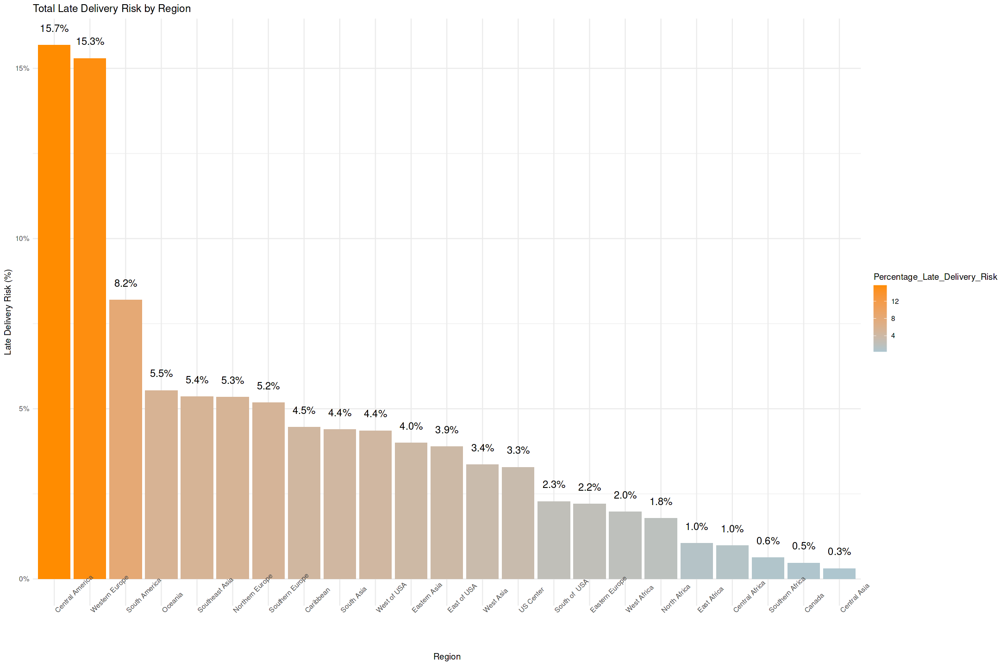

In [50]:
# Summarize the total late delivery risk by region
region_summary <- df %>%
  group_by(Order.Region) %>%
  summarise(Total_Late_Delivery_Risk = sum(Late_delivery_risk, na.rm = TRUE))

# Calculate the total late delivery risk for all regions
total_risk <- sum(region_summary$Total_Late_Delivery_Risk)

# Calculate percentage late delivery risk for each region
region_summary <- region_summary %>%
  mutate(Percentage_Late_Delivery_Risk = (Total_Late_Delivery_Risk / total_risk) * 100)

# Visualize the Late Delivery Risk by Region
ggplot(region_summary, aes(x = reorder(Order.Region, -Percentage_Late_Delivery_Risk), 
                            y = Percentage_Late_Delivery_Risk, 
                            fill = Percentage_Late_Delivery_Risk)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = label_percent(accuracy = 0.1)(Percentage_Late_Delivery_Risk / 100)), 
            hjust = 0.5, vjust = -1.8, size = 4.5, color = "black") +  # Add percentage labels on top of bars
  scale_fill_gradient(low = "#AEC6CF", high = "darkorange") +  # Color gradient for better visual
  scale_y_continuous(labels = label_percent(scale = 1)) +  # Format the y-axis as percentages
  theme_minimal() + 
  labs(title = "Total Late Delivery Risk by Region", 
       x = "Region", 
       y = "Late Delivery Risk (%)") +
  theme(axis.text.x = element_text(angle = 45, hjust = 0))  # Rotate x-axis labels for better readability

# Additional Analysis

18. **Find the Distribution of Sales by Delivery Status.**

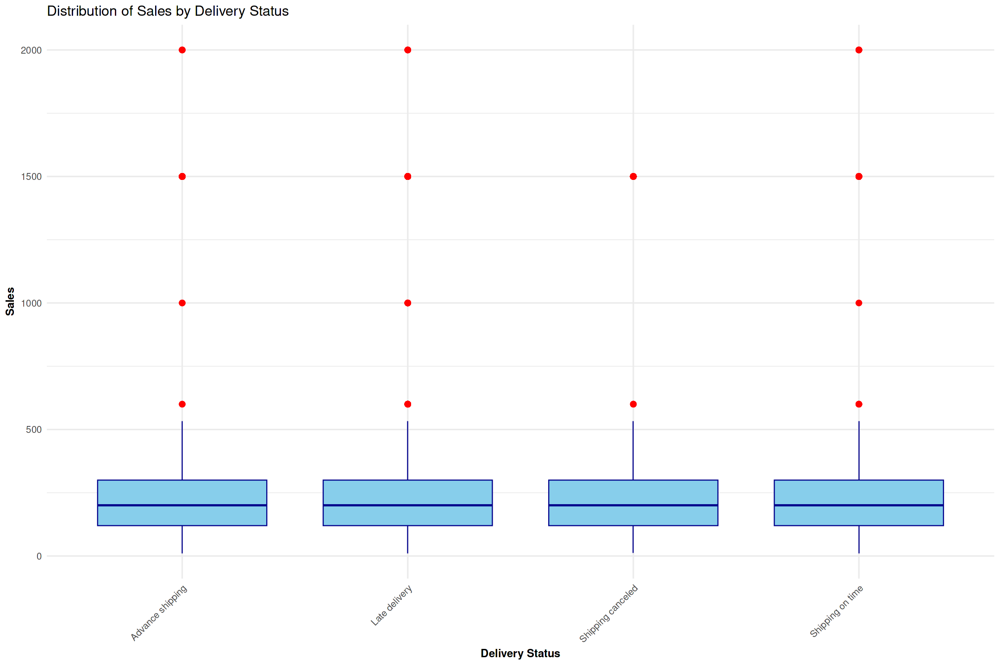

In [51]:
# Boxplot for the distribution of sales by delivery status
ggplot(df, aes(x = Delivery.Status, y = Sales)) +
  geom_boxplot(fill = "skyblue", color = "darkblue", outlier.colour = "red", outlier.size = 3) +  # Improved outlier visibility
  labs(title = "Distribution of Sales by Delivery Status", 
       x = "Delivery Status", 
       y = "Sales") +
  theme_minimal(base_size = 15) +  # Increased font size for better readability
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),  # Adjusted angle and font size for axis labels
        axis.title.x = element_text(size = 14, face = "bold"),
        axis.title.y = element_text(size = 14, face = "bold"))  # Bold axis titles for emphasis

19. **Find Distribution of Sales by Delivery Status and Department.**

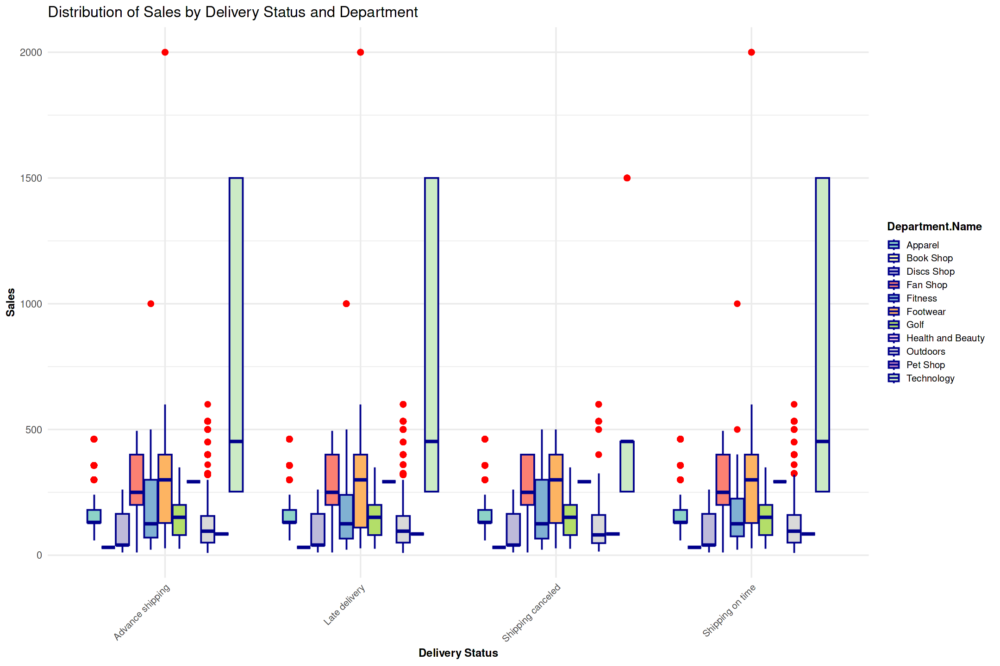

In [52]:
# Boxplot for the distribution of sales by delivery status and department
ggplot(df, aes(x = Delivery.Status, y = Sales, fill = Department.Name)) +
  geom_boxplot(outlier.colour = "red", position = position_dodge(0.8), 
               outlier.size = 3,  # Enhance visibility of outliers
               lwd = 0.8, color = "darkblue") +  # Added outline color for boxplot for better contrast
  labs(title = "Distribution of Sales by Delivery Status and Department",
       x = "Delivery Status", 
       y = "Sales") +
  theme_minimal(base_size = 16) +  # Larger base font for better readability
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),  # Rotate x-axis labels for readability
        axis.title.x = element_text(size = 14, face = "bold"),
        axis.title.y = element_text(size = 14, face = "bold"),
        legend.title = element_text(size = 14, face = "bold"),
        legend.text = element_text(size = 12)) +  # Styled legend text
  scale_fill_brewer(palette = "Set3")  # Added color palette for better visualization

20. **Find Profit Ratio per Department Name.**

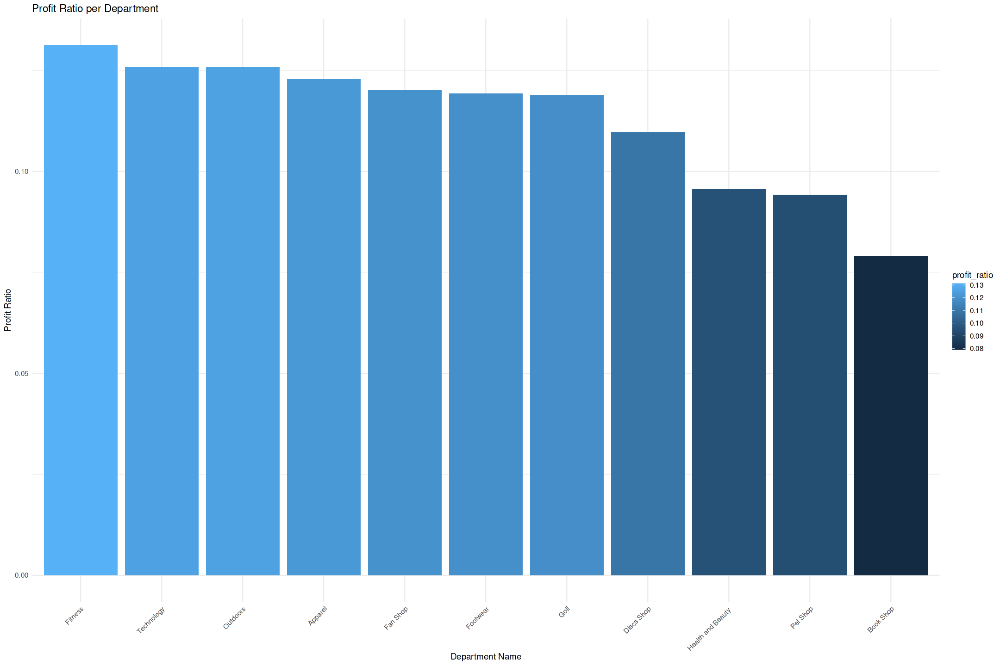

In [53]:
# Calculate the mean Profit Ratio per Department
department_profit_ratio <- df %>%
  group_by(Department.Name) %>%
  summarise(profit_ratio = mean(Order.Item.Profit.Ratio, na.rm = TRUE))  # Calculate mean Profit Ratio by Department

# Create a bar plot for Profit Ratio per Department
ggplot(department_profit_ratio, aes(x = reorder(Department.Name, -profit_ratio), y = profit_ratio, fill = profit_ratio)) +
  geom_bar(stat = "identity") +  # Create a bar for each department
  labs(title = "Profit Ratio per Department", x = "Department Name", y = "Profit Ratio") +  # Add labels and title
  theme_minimal() +  # Use a minimal theme for better visuals
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for better readability


# **Key Insights and Metrics**

1. **Transaction Types Distribution**:
   - **CASH**: 10.9% of transactions (19,616).
   - **DEBIT**: 38.4% of transactions (69,295).
   - **PAYMENT**: 23.1% of transactions (41,725).
   - **TRANSFER**: 27.6% of transactions (49,883).
   - **Conclusion**: DEBIT transactions are the most common, accounting for nearly 40%, while CASH transactions have the lowest representation.
   - **Recommendation**: Focus on optimizing DEBIT transactions by improving customer experiences such as seamless payments and loyalty programs for frequent users.

2. **Delivery Status Analysis**:
   - **Late Delivery**: 54.8% of transactions (98,977) dominate delivery statuses.
   - **Advance Shipping**: 23% of transactions (41,592).
   - **Shipping Canceled**: 4.3% of transactions (7,754).
   - **Shipping on Time**: 17.8% of transactions (32,196).
   - **Conclusion**: Late deliveries account for over half of all deliveries, significantly impacting customer satisfaction.
   - **Recommendation**: Address late delivery issues by enhancing supply chain efficiency and real-time delivery tracking to improve customer satisfaction.

3. **Shipping Modes Distribution**:
   - **Standard Class**: Most frequently used (59.7% of transactions, 107,752).
   - **Second Class**: 19.5% of transactions (35,216).
   - **First Class**: 15.4% of transactions (27,814).
   - **Same Day**: Least frequent (5.39%, 9,737).
   - **Conclusion**: Standard Class is the dominant shipping mode, with Same Day being underutilized.
   - **Recommendation**: Increase incentives for premium shipping modes like Same Day to reduce late delivery risks and attract time-sensitive customers.

4. **Late Delivery by Category**:
   - **Top Categories with Late Deliveries**: Cleats (13,496), Men's Footwear (12,121), Women's Apparel (11,478).
   - **Conclusion**: Fashion and footwear items face the highest late delivery risks.
   - **Recommendation**: Optimize inventory and logistics for these high-risk categories by leveraging predictive demand forecasting and enhancing supplier coordination.

5. **Countries with the Highest Average Sales per Customer**:
   - **Estados Unidos (EE. UU.)**: Average sales of $183.03.
   - **Puerto Rico**: Average sales of $183.23.
   - **Conclusion**: Both EE. UU. and Puerto Rico exhibit high average sales, suggesting strong customer engagement in these regions.
   - **Recommendation**: Allocate resources to strengthen customer relationships in these countries through tailored campaigns and exclusive offers.

6. **Customer Segment Contribution to Profit**:
   - **Highest Contributor**: Consumer segment ($2,073,487.67 in profit).
   - **Conclusion**: Consumer customers significantly drive profitability.
   - **Recommendation**: Expand personalized marketing strategies and loyalty programs for this segment to maintain and grow profitability.

7. **Average Sales per Customer by Segment**:
   - **Consumer**: $183.57.
   - **Corporate**: $183.08.
   - **Home Office**: $181.82.
   - **Conclusion**: Consumer customers yield the highest average sales, with Home Office customers slightly lagging.
   - **Recommendation**: Focus on boosting sales from Home Office customers through targeted discounts and specialized offerings.

8. **States with the Highest Sales per Customer**:
   - **Top State**: Alabama ($222.55 per customer).
   - **Conclusion**: Alabama demonstrates the highest customer spending, likely due to higher purchasing power or demand for specific products.
   - **Recommendation**: Explore similar opportunities in other high-potential states and replicate successful strategies from Alabama.

9. **Customer Segments with the Highest Late Delivery Risk**:
   - **Highest Risk Segment**: Home Office (55.07%).
   - **Conclusion**: Home Office customers face the highest late delivery risk, which could negatively impact retention.
   - **Recommendation**: Prioritize improving delivery reliability for Home Office custill address inefficiencies, improve customer satisfaction, and increase profitability.

---

# **Conclusions**

- **Performance Gaps**: Late deliveries are a critical issue, affecting over 50% of shipments and the Home Office segment disproportionately.
  
- **Transaction Insights**: DEBIT transactions and Standard Class shipping dominate the business but may require better support to enhance user satisfaction.
  
- **Regional Focus**: Estados Unidos, Puerto Rico, and Alabama emerge as higrforming regions/states in terms of sales per customer.

---

# **Recommendations**
1. **Improve Delivery Performance**:
   - Enhance supply chain processes to reduce late deliveries.
   - Offer delivery guarantees or compensation for delayed shipments to rebuild trust.

2. **Leverage Profitable Customer Segments**:
   - Prioritize personalized experiences for Consumer and Corporate segments to maximize revenue.
   - Increase engagement with high-sales regions such as EE. UU. and Puerto Rico.

3. **Adopt Data-Driven Marketing**:
   - Use insights from transaction types, shipping modes, and delivery statuses to design targeted campaigns.
   - Focus on converting low-performing segments like Home Office into high-value customers.

4. **Optimize Shipping Modes**:
   - Offer discounts or incentives for Same Day and First Class shipping to encourage premium options.
   - Invest in logistics infrastructure to support faster delivery modes.

5. **Focus on High-Risk Categories**:
   - Use predictive analytics to ensure timely inventory replenishmenps will address inefficiencies, improve customer satisfaction, and increase profitability.

---

# **Connect & Follow**
If you found my project insightful, I’d love to connect! I’m passionate about creating impactful data-driven solutions like this one to drive success. Follow me for more updates on my projects and insights. Let’s collaborate and grow together!

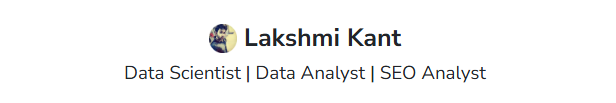


* Linkedin: https://www.linkedin.com/in/kant-ai/
  
* Portfolio: https://genrix.netlify.app/
  
* GitHub: https://github.com/genrix-ai